In [1]:
import tensorflow as tf
import numpy as np
np.random.seed(42)  # set global random generator
import os
import pandas as pd
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Layer, Input, Lambda, Conv2D, Dropout, Multiply, GlobalMaxPooling2D, MaxPooling2D, TimeDistributed, LSTM, Conv2DTranspose, concatenate, Concatenate, Dense, BatchNormalization, Activation, SeparableConv2D, add, Add, Multiply, SeparableConv2D, GlobalAveragePooling2D, DepthwiseConv2D, UpSampling2D, ZeroPadding2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import utils
import tensorflow.keras.backend as K
import matplotlib.pyplot as plt

In [2]:
# Check if TensorFlow is using the Metal plugin (I'm using a Macbook Air with a built in 16-core Neural Engin, want to make sure I'm using that to ensure faster runtime)
print("TensorFlow is using Metal:", tf.config.list_physical_devices('GPU'))

TensorFlow is using Metal: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


# Data Preprocessing

In [3]:
# ---- Global Variables and Methods----
IMAGE_FOLDER = "images/"
SAL_MAP_FOLDER = "saliency_maps/"
CSV_FILE = 'image_types.csv'
IMG_SIZE = (224, 224, 3)

In [4]:
# ---- Data Generator ----
class DataGenerator(tf.keras.utils.Sequence):
    '''
    A custom data loader for the UI images and saliency maps, inheriting from tf.keras.utils.Sequence.
    For instance, can be used with the following methods:
        model.fit(train_data_gen, validation_data=val_data_gen, ...)
        predictions = model.predict(data_gen)
        loss, mae = model.evaluate(data_gen)
    '''
    def __init__(self, image_folder, sal_map_folder, filenames, batch_size=1, shuffle=True, sample_size=None):
        '''
        Constructor:
            image_folder (str): Path to the folder containing input images.
            sal_map_folder (str): Path to the folder containing saliency maps.
            filenames (list): List of filenames to include in this generator.
            batch_size (int): Number of samples per batch.
            shuffle (bool): Whether to shuffle the data at the end of each epoch.
            sample_size (int): Number of samples to use (for debugging).
        '''
        self.image_folder = image_folder # string, path to the folder containing input images
        self.sal_map_folder = sal_map_folder # string, path to the folder containing saliency maps
        self.batch_size = batch_size # int, number of samples per batch
        self.filenames = filenames # list of filenames (shared between the input images and their corresponding saliency maps) to convert to data
        self.sample_size = sample_size
        self.shuffle = shuffle # boolean, if using random shuffle each epoch

        # Limit the dataset to a (smaller) sample_size if specified
        if self.sample_size and self.sample_size<len(self.filenames):
            self.filenames = self.filenames[:self.sample_size]

        self.on_epoch_end() # random shuffle

    def on_epoch_end(self): # if using random shuffle each epoch
        '''If shuffle=True, shuffles the list of filenames to randomize the order of data for the next epoch (automatically called by Keras)'''
        if self.shuffle:
            np.random.shuffle(self.filenames)

    def __len__(self):
        '''Returns the number of batches per epoch'''
        return int(np.floor(len(self.filenames) / self.batch_size))

    def __getitem__(self, index):
        '''
        Generates one batch of data given the index of the batch (automatically called by Keras)
        Returns tuple (X, Y), both normalized to [0,1]
        X: batch of input images of shape (batch_size, height, width, channels)
        Y: batch of corresponding saliency maps of shape (batch_size, height, width, 1)
        
        Can be called using the [] indexing operator
        '''
        # select a subset of filenames for the current batch
        batch_files = self.filenames[index * self.batch_size:(index + 1) * self.batch_size]

        # load and preprocess the images and saliency maps for the specified batch
        return self.__data_generation(batch_files)
    
    def __data_generation(self, batch_files):
        '''
        Load and preprocess the images and saliency maps.
        Returns tuple (X, Y), both normalized to [0,1]
        X: batch of input images of shape (batch_size, height, width, channels)
        Y: batch of corresponding saliency maps of shape (batch_size, height, width, 1)
        '''
        X, Y = [], []
        for file in batch_files:
            # UI image
            img_path = os.path.join(self.image_folder, file)
            img = load_img(img_path, target_size=IMG_SIZE[:2]) # load and resize image to IMG_SIZE
            img = img_to_array(img) / 255.0 # convert images to arrays and normalize them to [0,1]
            
            # corresponding saliency map (grayscale)
            sal_path = os.path.join(self.sal_map_folder, file)
            sal_img = load_img(sal_path, target_size=IMG_SIZE[:2], color_mode="grayscale") # load and resize image to IMG_SIZE
            sal_img = img_to_array(sal_img) / 255.0 # convert images to arrays and normalize them to [0,1], use normalize()????
            
            X.append(img)
            Y.append(sal_img)

        return np.array(X), np.array(Y) # convert from list to np.arrays

In [5]:
# ---- Handle Missing Data ----
# Load the CSV file into a DataFrame
df = pd.read_csv(CSV_FILE, sep=',')

# Get the list of filenames from the CSV file, the image folder, and the saliency map folder
csv_filenames = set(df["Image Name"])
image_filenames = set(os.listdir(IMAGE_FOLDER))
sal_map_filenames = set(os.listdir(SAL_MAP_FOLDER))

print(f"There are {len(csv_filenames)} filenames in the CSV file.")
print(f"There are {len(image_filenames)} filenames in the Image folder.")
print(f"There are {len(sal_map_filenames)} filenames in the Saliency Map folder.")


# Find filenames that are missing in any of the three locations
missing_files = (csv_filenames | image_filenames | sal_map_filenames) - (csv_filenames & image_filenames & sal_map_filenames)

# Print missing filenames
if missing_files:
    print("The following filenames are missing in one or more locations:")
    for filename in missing_files:
        print(filename)
else:
    print("All filenames are present in all three locations.")

# Remove missing filenames from the CSV file
df = df[~df['Image Name'].isin(missing_files)]

print(f"Removed {len(missing_files)} filenames from the CSV file.\n")
print(f'Remaining Number of Data Samples:{df.shape[0]}')
print(f'Remaining Number of Desktop Samples:{df[df["Category"] == "desktop"].shape[0]}')
print(f'Remaining Number of Mobile Samples:{df[df["Category"] == "mobile"].shape[0]}')
print(f'Remaining Number of Web Samples:{df[df["Category"] == "web"].shape[0]}')
print(f'Remaining Number of Poster Samples:{df[df["Category"] == "poster"].shape[0]}')

There are 1463 filenames in the CSV file.
There are 1483 filenames in the Image folder.
There are 1924 filenames in the Saliency Map folder.
The following filenames are missing in one or more locations:
c053d2.jpg
d9508a.png
38ad0c.png
c2a57a.png
fc9315.jpg
fcac91.png
592d83.png
e3d8f9.jpg
48a5a0.png
63508a.png
511db2.png
e1f7b0.jpg
e74016.png
ac484e.png
fb0956.png
5b51c9.jpg
c50a3d.png
bf2da8.png
cc9bc8.png
eb34f4.png
fc4494.jpg
c4be71.jpg
6dacc6.jpg
ed3849.jpg
fdafcb.png
d205d8.png
e102af.png
7c5f79.png
e017a7.png
ab0c83.png
f7c681.png
ecf129.png
e2dea3.jpg
c5ea52.jpg
50802a.jpg
35a756.png
48806f.png
5bdff0.jpg
e1217f.png
c71a6f.png
ebe076.jpg
a9793b.png
e93e5e.jpg
7dea7a.jpg
a47405.png
eb0400.png
548c01.jpg
ffb688.png
fd4c35.jpg
d42246.png
d07437.png
58033d.jpg
d7346d.png
ab09c3.png
7c5f7f.jpg
88927a.png
ebd305.png
fdda92.png
7b6c15.jpg
7a9967.jpg
fc7118.jpg
edbb42.png
6f11a2.png
7d1335.png
db12fc.png
f29c75.png
51f811.png
ffde86.jpg
538c08.png
ab791d.png
fd0d5c.jpg
f14f17.jpg
7caa9

In [6]:
# ---- Initialize DataLoaders ----

# Filter by category if needed (desktop, poster, mobile, web) !!!
df = df[df['Category'] == "desktop"]

# Split the training data by randomly selecting valid_size*100% of the training data for validation
train_files = df[df['Train/Test'] == 'Train']['Image Name'].tolist()
valid_size = 0.2 # Split ratio
valid_indices = np.random.choice(len(train_files), int(len(train_files) * valid_size), replace=False)

# Get the list of...
valid_files = [train_files[i] for i in valid_indices] # validation filenames
train_files = [train_files[i] for i in range(len(train_files)) if i not in valid_indices] # training filenames
test_files = df[df['Train/Test'] == 'Test']['Image Name'].tolist() # testing filenames

# Check the number of batches in each generator
print("Number of training samples:", len(train_files))
print("Number of validation samples:", len(valid_files))
print("Number of test samples:", len(test_files))

# Initialize the training, validation, testing DataGenerators TODO: use full dataset later
train_data_gen = DataGenerator(IMAGE_FOLDER, SAL_MAP_FOLDER, train_files, batch_size = 1, sample_size=50)
valid_data_gen = DataGenerator(IMAGE_FOLDER, SAL_MAP_FOLDER, valid_files, shuffle=False, batch_size = 1, sample_size=10) # no need to shuffle validation data
test_data_gen = DataGenerator(IMAGE_FOLDER, SAL_MAP_FOLDER, test_files, shuffle=False, batch_size = 1, sample_size=10) # no need to shuffle test data

# Check the number of batches in each generator
print("Number of training batches:", len(train_data_gen))
print("Number of validation batches:", len(valid_data_gen))
print("Number of test batches:", len(test_data_gen))

# View the first batch of training data
batch1 = train_data_gen[0]
print("Training input batch shape:", batch1[0].shape)
print("Training saliency batch shape:", batch1[1].shape)

Number of training samples: 276
Number of validation samples: 69
Number of test samples: 18
Number of training batches: 50
Number of validation batches: 10
Number of test batches: 10
Training input batch shape: (1, 224, 224, 3)
Training saliency batch shape: (1, 224, 224, 1)


# Defining Methods for Evaluating the Model Training Process and Performance

In [7]:
# Plot the learning curve
def plot_learning_curve(history):
    # Extract loss and metrics from the history object
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    epochs = range(1, len(loss) + 1)
    
    # Plot the loss curve (use combined loss!!!)
    plt.figure(figsize=(12, 5))
    
    plt.subplot(1, 2, 1)
    plt.plot(epochs, loss, 'bo-', label='Training Loss')
    plt.plot(epochs, val_loss, 'ro-', label='Validation Loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
        
    plt.tight_layout()
    plt.show()

In [8]:
# Function to visualize the original image, ground truth saliency map, and predicted saliency map
def visualize_results(model, data_gen, num_samples=5):
    plt.figure(figsize=(15, 5 * num_samples))
    
    for i in range(num_samples):
        # Get a new batch for each sample
        X, Y_sal = data_gen[i % len(data_gen)]  # Cycle through batches if num_samples > batch_size
        
        # Predict saliency map
        Y_pred = model.predict(X, verbose=0)
        
        # Original Image (already resized to IMG_SIZE in DataGenerator)
        plt.subplot(num_samples, 3, i * 3 + 1)
        plt.imshow(X[0])  # Only use the first sample in the batch
        plt.title("Original Image")
        plt.axis('off')
        
        # Ground Truth Saliency Map (already resized to IMG_SIZE in DataGenerator)
        plt.subplot(num_samples, 3, i * 3 + 2)
        plt.imshow(Y_sal[0].squeeze(), cmap='gray')  # Only use the first sample in the batch
        plt.title("Ground Truth Saliency Map")
        plt.axis('off')
        
        # Predicted Saliency Map (already resized to IMG_SIZE in DataGenerator)
        plt.subplot(num_samples, 3, i * 3 + 3)
        plt.imshow(Y_pred[0].squeeze(), cmap='gray')  # Only use the first sample in the batch
        plt.title("Predicted Saliency Map")
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

# Defining the Loss Terms and Model Evaluation Metrics

### Define various normalization and scaling functions

In [9]:
# ----------------------------- Scaling Functions ----------------------------- 

def batch_min_max_scaling(heatmap):
    '''
    Min-Max scaling
    This method is from 'sal_imp_utilities.py' written by the UEyes team, called 'normalize'.
    '''

    # Apply mimaxscaler algorithm (https://en.wikipedia.org/wiki/Feature_scaling#Rescaling_(min-max_normalization))
    heatmap = (heatmap - K.min(heatmap)) / (K.epsilon() + K.max(heatmap) - K.min(heatmap))
    
    return heatmap

def min_max_scaling(heatmap):
    '''
    Min-Max scaling
    '''
    # Compute min and max for each sample in the batch
    min_vals = K.min(heatmap, axis=[1, 2], keepdims=True)  # Shape: (batch_size, 1, 1, 1)
    max_vals = K.max(heatmap, axis=[1, 2], keepdims=True)  # Shape: (batch_size, 1, 1, 1)

    # Apply min-max scaling to each sample
    heatmap = (heatmap - min_vals) / (K.epsilon() + max_vals - min_vals)

    return heatmap

def max_scaling(heatmap):
    '''
    Max scaling
    This method is adapted from 'sal_imp_utilities.py' written by the UEyes team.
    '''

    max_heatmap = K.repeat_elements(K.expand_dims(K.repeat_elements(K.expand_dims(K.max(heatmap, axis=[1,2]), axis=2), # or axis=2),???
                                                                   IMG_SIZE[0], axis=1), axis=2), IMG_SIZE[1], axis=2)
    heatmap /= max_heatmap
    
    return heatmap




# ----------------------------- Normalization Functions ----------------------------- 

def batch_sum_normalize(heatmap):
    '''
    Sum Normalize heatmap values in the [0,1] range across the tensor (batch).
    '''
    heatmap /= (K.epsilon() + K.sum(heatmap))

    return heatmap

def sum_normalize(heatmap):
    '''
    Sum Normalize heatmap values in the [0,1] range across each map in the tensor (batch).
    '''
    #sum_heatmap = K.repeat_elements(K.expand_dims(K.repeat_elements(K.expand_dims(K.sum(heatmap, axis=[1,2]), axis=1), IMG_SIZE[0], axis=1), axis=2), IMG_SIZE[1], axis=2)

    heatmap /= (K.epsilon() + K.sum(heatmap, axis=[1, 2], keepdims=True))

    return heatmap

def mean_std_normalize(heatmap):
    '''
    Apply whitening algorithm, which is basically mean-std normalization but for each pixel???
    See https://en.wikipedia.org/wiki/Whitening_transformation
    This method is from 'sal_imp_utilities.py' written by the UEyes team, called 'whiten'
    '''
    
    # Convert input to TensorFlow tensor if it's a NumPy array
    if isinstance(heatmap, np.ndarray):
        heatmap = tf.convert_to_tensor(heatmap)

    # Compute mean and std over the spatial dimensions (height and width)
    heatmap_mean = K.mean(heatmap, axis=[1, 2], keepdims=True)  # Shape: (batch_size, 1, 1, channels)
    heatmap_std = K.std(heatmap, axis=[1, 2], keepdims=True)    # Shape: (batch_size, 1, 1, channels)

    # Normalize the heatmap
    return (heatmap - heatmap_mean) / (heatmap_std + K.epsilon())

### Define various loss functions

In [17]:
# ------------------------------------ Losses used by UEyes Team ------------------------------------

mse = tf.keras.losses.MeanSquaredError()


def nss_(y_true, y_pred):
    """
    Compute Normalized Scanpath Saliency (NSS) score.
    This method is from 'losses_keras2.py' written by the UEyes team.
    """
    ax = 1

    if K.all(K.equal(K.sum(K.sum(y_true, axis=ax), axis=ax), 0.0)):
        return 0.0

    max_y_pred = K.repeat_elements(K.expand_dims(K.repeat_elements(K.expand_dims(K.max(K.max(y_pred, axis=ax), axis=ax), axis=ax+1), IMG_SIZE[0], axis=ax), axis=ax+1), IMG_SIZE[1], axis=ax+1)

    y_pred /= max_y_pred

    y_pred_flatten = K.batch_flatten(y_pred)

    y_mean = K.mean(y_pred_flatten, axis=-1)
    y_mean = K.repeat_elements(K.expand_dims(K.repeat_elements(K.expand_dims(K.expand_dims(y_mean)), IMG_SIZE[0], axis=ax)), IMG_SIZE[1], axis=ax+1)

    y_std = K.std(y_pred_flatten, axis=-1)
    y_std = K.repeat_elements(K.expand_dims(K.repeat_elements(K.expand_dims(K.expand_dims(y_std)), IMG_SIZE[0], axis=ax)), IMG_SIZE[1], axis=ax+1)

    y_pred = (y_pred - y_mean) / (y_std + K.epsilon())

    den = K.sum(K.sum(y_true * y_pred, axis=ax), axis=ax)
    nom = K.sum(K.sum(y_true, axis=ax), axis=ax) + K.epsilon()

    nss_out = den/nom

    return nss_out


def nss(y_true, y_pred):
    """
    Compute Normalized Scanpath Saliency (NSS) score.
    This method is adapted from 'losses_keras2.py' written by the UEyes team.
    """

    if K.all(K.equal(K.sum(y_true, axis=[1,2]), 0.0)):
        return 0.0

    #y_pred = max_scaling(y_pred) # idk why use max-scaling at all before normalization, makes little difference???
    y_pred = mean_std_normalize(y_pred)

    den = K.sum(y_true * y_pred, axis=[1,2])
    nom = K.sum(y_true, axis=[1,2]) + K.epsilon()

    return den/nom

def correlation_coefficient_(y_true, y_pred):
    """
    Compute Cross-Correlation (CC) score.
    This method is from 'losses_keras2.py' written by the UEyes team.
    """
    max_y_pred = K.repeat_elements(K.expand_dims(K.repeat_elements(K.expand_dims(K.max(K.max(y_pred, axis=1), axis=1), axis=1),
                                                                   IMG_SIZE[0], axis=1), axis=2), IMG_SIZE[1], axis=2)
    y_pred /= max_y_pred

    sum_y_true = K.repeat_elements(K.expand_dims(K.repeat_elements(K.expand_dims(K.sum(K.sum(y_true, axis=1), axis=1), axis=1),
                                                                   IMG_SIZE[0], axis=1), axis=2), IMG_SIZE[1], axis=2)
    sum_y_pred = K.repeat_elements(K.expand_dims(K.repeat_elements(K.expand_dims(K.sum(K.sum(y_pred, axis=1), axis=1), axis=1),
                                                                   IMG_SIZE[0], axis=1), axis=2), IMG_SIZE[1], axis=2)
    y_true /= (sum_y_true + K.epsilon())
    y_pred /= (sum_y_pred + K.epsilon())

    N = IMG_SIZE[0] * IMG_SIZE[1]
    sum_prod = K.sum(K.sum(y_true * y_pred, axis=1), axis=1)
    sum_x = K.sum(K.sum(y_true, axis=1), axis=1)
    sum_y = K.sum(K.sum(y_pred, axis=1), axis=1)
    sum_x_square = K.sum(K.sum(K.square(y_true), axis=1), axis=1)
    sum_y_square = K.sum(K.sum(K.square(y_pred), axis=1), axis=1)

    num = sum_prod - ((sum_x * sum_y) / N)
    den = K.sqrt((sum_x_square - K.square(sum_x) / N) * (sum_y_square - K.square(sum_y) / N))

    return num / den

def correlation_coefficient(y_true, y_pred):
    """
    Compute Absolute Correlation Coefficient score, range is [0,1]
    This method is adapted from 'losses_keras2.py' written by the UEyes team.
    """

    #y_pred = max_scaling(y_pred) # idk why use max-scaling at all before normalization, makes little difference???
    y_pred = sum_normalize(y_pred)
    y_true = sum_normalize(y_true)

    # debug, del later!!!
    #print('y_pred has nan values: ', tf.reduce_any(tf.math.is_nan(y_pred)))
    #print('y_true has nan values: ', tf.reduce_any(tf.math.is_nan(y_true)))

    N = IMG_SIZE[0] * IMG_SIZE[1]
    sum_prod = K.sum(y_true * y_pred, axis=[1,2])
    sum_x = K.sum(y_true, axis=[1,2])
    sum_y = K.sum(y_pred, axis=[1,2])
    sum_x_square = K.sum(K.square(y_true), axis=[1,2])
    sum_y_square = K.sum(K.square(y_pred), axis=[1,2])

    num = sum_prod - ((sum_x * sum_y) / N)
    den = K.sqrt((sum_x_square - K.square(sum_x) / N) * (sum_y_square - K.square(sum_y) / N)) + K.epsilon()

    #print('non-zeros in \'den\': ', tf.math.count_nonzero(den))

    return K.abs(num / den) # take the absolute value to bound range bt [0,1] instead of [-1,1]


def batch_min_max_sum_normalize(heatmap):
    '''
    Min-Max scaling
    Sum Normalize heatmap values in the [0,1] range across entire tensor (batch).
    This method is from 'sal_imp_utilities.py' written by the UEyes team, called 'normalize'.
    '''

    # Apply mimaxscaler algorithm (https://en.wikipedia.org/wiki/Feature_scaling#Rescaling_(min-max_normalization))
    heatmap = (heatmap - K.min(heatmap)) / (K.epsilon() + K.max(heatmap) - K.min(heatmap))

    # Sum normalization
    heatmap /= (K.epsilon() + K.sum(heatmap))
    
    return heatmap
def similarity_(y_true, y_pred):
    '''
    Compute Similarity score.
    This method is from 'losses_keras2.py' written by the UEyes team.
    '''
    y_pred = batch_min_max_sum_normalize(y_pred)
    y_true = batch_min_max_sum_normalize(y_true)

    return K.sum(K.minimum(y_pred, y_true))


def similarity(y_true, y_pred):
    '''
    Compute Similarity score, range is [0,1]
    Intersection/overlap between the predicted and the ground-truth saliency maps
    the sum of the minimum value of the normalized predicted map and ground-truth map. 
    The absence of saliency values points to zero similarity (sensitive to failed detection of saliency points)

    This method is adapted from 'losses_keras2.py' written by the UEyes team.
    '''

    # original normalization implementation, not sure what the point of min-max scaling is before the sum normalization, makes little difference???
    #y_pred = batch_min_max_scaling(y_pred)
    #y_true = batch_min_max_scaling(y_true)

    # sum normalization across each map so that the similarity score is [0,1] per batch of maps
    y_pred = batch_sum_normalize(y_pred)
    y_true = batch_sum_normalize(y_true)

    return K.sum(K.minimum(y_pred, y_true))


kl = tf.keras.losses.KLDivergence() # Initialize the KL Divergence loss instance once
def kl_divergence(y_true, y_pred):
    '''
    Compute Kullback-Leibler divergence loss, range is [0,inf)
    Quantifies the difference between the distributions of the saliency map prediction and the ground truth (the smaller the better)

    This method is from 'losses_keras2.py' written by the UEyes team.
    '''
    #y_pred = max_scaling(y_pred) # used axis=1??? also idk why use max-scaling at all before normalization, makes no difference???
    y_pred = sum_normalize(y_pred)
    y_true = sum_normalize(y_true)

    # min-max scaling s.t. pixels of maps in each batch is bt [0,1]
    y_pred = batch_min_max_scaling(y_pred)
    y_true = batch_min_max_scaling(y_true)
    
    return kl(y_true,y_pred)




# ------------------------------------ New Losses to Consider ------------------------------------

mae = tf.keras.losses.MeanAbsoluteError()
"""
Compute the MAE between two (batches of) saliency maps y and y'.
"""


cosine_similarity = tf.keras.metrics.CosineSimilarity(axis=[1,2])
"""
Compute the cosine similarity between two (batches of) saliency maps y and y'.
"""

def similarity_opposite(y_true, y_pred):
    '''
    Compute Similarity score, range is [0,1]
    Intersection/overlap between the predicted and the ground-truth saliency maps
    the sum of the maximum value of the normalized predicted map and ground-truth map. 
    The absence of non-salient values points to zero similarity (sensitive to failed detection of non-salient points)

    This method is adapted from 'losses_keras2.py' written by the UEyes team.
    '''

    # original normalization implementation, not sure what the point of min-max scaling is before the sum normalization, makes little difference???
    #y_pred = batch_min_max_scaling(y_pred)
    #y_true = batch_min_max_scaling(y_true)

    # sum normalization across each map so that the similarity score is [0,1] per batch of maps
    y_pred = batch_sum_normalize(y_pred)
    y_true = batch_sum_normalize(y_true)

    return K.sum(K.maximum(y_pred, y_true))

def entropy(y_true, y_pred):
    """
    TODO: binary focal cross entropy from keras
    """
    return

### Combine different loss functions to form loss terms

In [20]:
# ------------------------------------ Loss Combinations used by UEyes Team ------------------------------------

def combined_loss_UEyes(y_true, y_pred):
    '''
    Loss function that combines cc, nss and kl. Beacuse nss receives a different ground truth than kl and cc (maps),
        the function requires y_true to contains both maps. It has to be a tensor with dimensions [bs, 2, r, c, 1]. y_pred also
        has to be a tensor of the same dim, so the model should add a 5th dimension between bs and r and repeat the predict map
        twice along that dim.
    This method is adapted from the method in 'losses_keras2.py' written by the UEyes team.
    Returns a combined loss term with the specified weights that can be used in model.compile().
    '''

    # loss term weights specified by the UEyes team
    kl_weight=10.0
    cc_weight=3.0
    sim_weight=1.0
    nss_weight=0.5
    mse_weight=1

    # compute loss terms
    k = kl_divergence(y_true, y_pred)
    c = correlation_coefficient(y_true, y_pred) # cc becoming nan values after 8 passes???
    n = nss(y_true, y_pred)
    s = similarity(y_true, y_pred)
    m = mse(y_true, y_pred) # tf.reduce_mean(tf.square(y_true - y_pred))
    
    # combined loss
    #return kl_weight*k - nss_weight*n + mse_weight*m #- cc_weight*c - sim_weight*s
    return kl_weight*k - nss_weight*n - sim_weight*s - cc_weight*c  + mse_weight*m 

def combined_loss_UEyes_2(y_true, y_pred):
    '''
    Loss function that combines cc, nss and kl. Beacuse nss receives a different ground truth than kl and cc (maps),
        the function requires y_true to contains both maps. It has to be a tensor with dimensions [bs, 2, r, c, 1]. y_pred also
        has to be a tensor of the same dim, so the model should add a 5th dimension between bs and r and repeat the predict map
        twice along that dim.
    This method is adapted from the method in 'losses_keras2.py' written by the UEyes team.
    Returns a combined loss term with the specified weights that can be used in model.compile().
    '''

    # loss term weights specified by the UEyes team
    kl_weight=10.0
    nss_weight=0.5
    mse_weight=1

    # compute loss terms
    k = kl_divergence(y_true, y_pred)
    n = nss(y_true, y_pred)
    m = mse(y_true, y_pred) # tf.reduce_mean(tf.square(y_true - y_pred))
    
    # combined loss
    return kl_weight*k - nss_weight*n + mse_weight*m 



# ------------------------------------ New Loss Combinations to Consider ------------------------------------
def combined_loss(y_true, y_pred):
    '''
    Returns a combined loss term with the specified weights that can be used in model.compile().
    TODO: add the new loss terms to consider
    '''

    # loss term weights
    kl_weight=10.0
    cc_weight=3.0
    sim_weight=1.0
    nss_weight=0.5
    #mse_weight=1
    #mae_weight=1
    cs_weight=1

    # compute loss terms
    k = kl_divergence(y_true, y_pred)
    c = correlation_coefficient(y_true, y_pred) # cc becoming nan values after 8 passes???
    n = nss(y_true, y_pred)
    s = similarity(y_true, y_pred)
    #m = mse(y_true, y_pred)
    #m = mae(y_true, y_pred)
    cs = cosine_similarity(y_true, y_pred)
    
    # combined loss
    return kl_weight*k - nss_weight*n - sim_weight*s - cc_weight*c - cs_weight*cs #+ mae_weight*m

def combined_loss_2(y_true, y_pred):
    '''
    Returns a combined loss term with the specified weights that can be used in model.compile().
    TODO: add the new loss terms to consider
    '''

    # loss term weights
    kl_weight=8.0
    cc_weight=2.0
    sim_weight=3.0
    sim_oppo_weight=5.0
    nss_weight=8.0
    mse_weight=1
    #mae_weight=1
    cs_weight=1.0

    # compute loss terms
    k = kl_divergence(y_true, y_pred)
    c = correlation_coefficient(y_true, y_pred) # cc becoming nan values after 8 passes???
    n = nss(y_true, y_pred)
    s1 = similarity(y_true, y_pred)
    s2 = similarity_opposite(y_true, y_pred)
    m = mse(y_true, y_pred)
    #m = mae(y_true, y_pred)
    cs = cosine_similarity(y_true, y_pred)
    
    # combined loss
    return kl_weight*k - nss_weight*n - sim_weight*s1 - sim_oppo_weight*s2 - cs_weight*cs + mse_weight*m # - cc_weight*c 

### Define various evaluation metrics

In [12]:
# ------------------------------------ Metrics used by UEyes Team ------------------------------------

auc_ROC = tf.keras.metrics.AUC(num_thresholds=100) # Initialize the AUC metric instance once
def auc_judd(y_true, y_pred):
    """
    Compute AUC-Judd score (from the ROC curve).
    """

    auc_ROC.update_state(y_true, y_pred)
    return auc_ROC.result()


def information_gain(y_true, y_pred, baseline="uniform"):
    """
    Compute Information Gain (IG) score. 
    (TODO: check the definition bc UEyes didn't provide implementation)!!!

    Positive IG: Indicates that the predicted saliency map provides more information than the baseline.
    Zero IG: Indicates that the predicted saliency map provides the same amount of information as the baseline.
    Negative IG: Indicates that the predicted saliency map provides less information than the baseline.
    """

    # Define the baseline ???
    y_baseline = tf.ones_like(y_true) / (IMG_SIZE[0] * IMG_SIZE[1])
    if baseline == "uniform":
        # Uniform distribution (1/N)
        y_baseline = tf.ones_like(y_true) / (IMG_SIZE[0] * IMG_SIZE[1])
    elif baseline == "center":
        # Create a center bias map (Gaussian centered at the image center)
        x = tf.linspace(-1.0, 1.0, 224)
        y = tf.linspace(-1.0, 1.0, 224)
        x, y = tf.meshgrid(x, y)
        y_baseline = tf.exp(-(x**2 + y**2) / 0.1)  # Gaussian kernel
        y_baseline = y_baseline / (K.sum(y_baseline) + K.epsilon())  # Normalize
        y_baseline = tf.expand_dims(y_baseline, axis=-1)  # Add channel dimension
        y_baseline = tf.expand_dims(y_baseline, axis=0)  # Add batch dimension

    
    # Sum normalization (so that the saliency maps are normalized to sum to 1, i.e., are probability distributions) ???
    y_pred = sum_normalize(y_pred)
    y_true = sum_normalize(y_true)

    # Compute log-likelihood ratio
    log_ratio = K.log((y_pred + K.epsilon()) / (y_baseline + K.epsilon()))

    # Compute IG
    return K.mean(K.sum(y_true * log_ratio, axis=[1, 2]))


# ------------------------------------ New Metrics to Consider ------------------------------------

auc_PR_ = tf.keras.metrics.AUC(num_thresholds=100, curve='PR') # Initialize the AUC metric instance once
def auc_PR(y_true, y_pred):
    """
    Compute AUC score (from the precision-recall curve).
    """

    auc_PR_.update_state(y_true, y_pred)
    return auc_PR_.result()


In [13]:
# TODO: verify that all the above functions work with batch saliency map tensors
print(train_data_gen[4][1].shape)
#print("kl_divergence: ", kl_divergence(train_data_gen[4][1], train_data_gen[0][1]))
print("correlation_coefficient: ", correlation_coefficient(train_data_gen[4][1], train_data_gen[0][1]))
print("correlation_coefficient: ", correlation_coefficient_(train_data_gen[4][1], train_data_gen[0][1]))
print("similarity: ", similarity(train_data_gen[4][1], train_data_gen[0][1]))
print("similarity: ", similarity_(train_data_gen[4][1], train_data_gen[0][1]))
print("nss: ", nss(train_data_gen[4][1], train_data_gen[0][1]))
print("nss: ", nss_(train_data_gen[4][1], train_data_gen[0][1]))
#print("mse: ", mse(train_data_gen[4][1], train_data_gen[0][1]))
#print("mae: ", mae(train_data_gen[4][1], train_data_gen[0][1]))
#print("auc_judd: ", auc_judd(train_data_gen[4][1], train_data_gen[0][1]))
#print("information_gain: ", information_gain(train_data_gen[4][1], train_data_gen[0][1]))
print("cosine_similarity: ", cosine_similarity(train_data_gen[4][1], train_data_gen[0][1]))
#print("auc_PR: ", auc_PR(train_data_gen[4][1], train_data_gen[0][1]))
#print(entropy(train_data_gen[4][1], train_data_gen[0][1]))

(1, 224, 224, 1)


correlation_coefficient:  tf.Tensor([[0.46100003]], shape=(1, 1), dtype=float32)
correlation_coefficient:  tf.Tensor([[0.46048242]], shape=(1, 1), dtype=float32)
similarity:  tf.Tensor(0.42997387, shape=(), dtype=float32)
similarity:  tf.Tensor(0.42997384, shape=(), dtype=float32)
nss:  tf.Tensor([[0.97983825]], shape=(1, 1), dtype=float32)
nss:  tf.Tensor([[0.97983825]], shape=(1, 1), dtype=float32)
cosine_similarity:  tf.Tensor(0.5596489, shape=(), dtype=float32)


In [14]:
combined_metrics=['mse', # Mean Squared Error
                  'mae', # Mean Squared Error
                    auc_judd,  # AUC-Judd (of ROC curve)
                    auc_PR,  # AUC of PR curve
                    nss,       # Normalized Scanpath Saliency
                    information_gain,  # Information Gain
                    similarity,  # Similarity
                    correlation_coefficient,  # Absolute Correlation Coefficient
                    cosine_similarity, # Cosine Similarity
                    kl_divergence]  # KL Divergence

pd.set_option('display.float_format', '{:.15f}'.format)
def train_test_performance(model):
    '''
    Display the model's performance on training data and test data across different metrics.
    '''
    # Compute performance on train data
    performance_train = {}
    for metric in model.metrics:
        result = metric.result()
        result = result.numpy().item()
        if isinstance(result, dict):
            performance_train.update(result)
        else:
            performance_train[metric.name] = result
    performance_train = pd.DataFrame(performance_train,index=['Train'])

    # Compute performance on test data
    performance_test = model.evaluate(test_data_gen,return_dict=True, verbose=0)
    performance_test = pd.DataFrame(performance_test,index=['Test'])

    # Provide results in a table    
    return pd.concat([performance_train, performance_test])

# The Simplified Copycat UMSI++ Model

### Define the model architecture

In [15]:
# Define the UMSI++ model
def UMSI_simple(input_shape=(224, 224, 3)):
    # Input layer
    inputs = Input(shape=input_shape)
    
    # --------------------------
    # Encoder (Feature Extraction)
    # --------------------------
    # Block 1
    x1 = Conv2D(32, (3, 3), activation='relu', padding='same', name='block1_conv1')(inputs)
    x1 = Conv2D(32, (3, 3), activation='relu', padding='same', name='block1_conv2')(x1)
    p1 = MaxPooling2D((2, 2), name='block1_pool')(x1)
    
    # Block 2
    x2 = Conv2D(64, (3, 3), activation='relu', padding='same', name='block2_conv1')(p1)
    x2 = Conv2D(64, (3, 3), activation='relu', padding='same', name='block2_conv2')(x2)
    p2 = MaxPooling2D((2, 2), name='block2_pool')(x2)
    
    # Block 3
    x3 = Conv2D(128, (3, 3), activation='relu', padding='same', name='block3_conv1')(p2)
    x3 = Conv2D(128, (3, 3), activation='relu', padding='same', name='block3_conv2')(x3)
    p3 = MaxPooling2D((2, 2), name='block3_pool')(x3)
    
    # --------------------------
    # Bottleneck (Multi-Scale Feature Aggregation)
    # --------------------------
    bottleneck = Conv2D(256, (3, 3), activation='relu', padding='same', name='bottleneck_conv1')(p3)
    bottleneck = Conv2D(256, (3, 3), activation='relu', padding='same', name='bottleneck_conv2')(bottleneck)
    
    # --------------------------
    # Decoder (Saliency Map Reconstruction)
    # --------------------------
    # Block 4
    u4 = Conv2DTranspose(128, (3, 3), strides=(2, 2), padding='same', name='block4_deconv')(bottleneck)
    u4 = concatenate([u4, x3], name='block4_concat')
    u4 = Conv2D(128, (3, 3), activation='relu', padding='same', name='block4_conv1')(u4)
    u4 = Conv2D(128, (3, 3), activation='relu', padding='same', name='block4_conv2')(u4)
    
    # Block 5
    u5 = Conv2DTranspose(64, (3, 3), strides=(2, 2), padding='same', name='block5_deconv')(u4)
    u5 = concatenate([u5, x2], name='block5_concat')
    u5 = Conv2D(64, (3, 3), activation='relu', padding='same', name='block5_conv1')(u5)
    u5 = Conv2D(64, (3, 3), activation='relu', padding='same', name='block5_conv2')(u5)
    
    # Block 6
    u6 = Conv2DTranspose(32, (3, 3), strides=(2, 2), padding='same', name='block6_deconv')(u5)
    u6 = concatenate([u6, x1], name='block6_concat')
    u6 = Conv2D(32, (3, 3), activation='relu', padding='same', name='block6_conv1')(u6)
    u6 = Conv2D(32, (3, 3), activation='relu', padding='same', name='block6_conv2')(u6)
    
    # --------------------------
    # Saliency Output
    # --------------------------
    saliency_output = Conv2D(1, (1, 1), activation='sigmoid', name='saliency_output')(u6)
    
    # --------------------------
    # Define the Model
    # --------------------------
    model = Model(inputs, saliency_output, name='UMSI_simple')  # Use a valid model name
    
    return model

### Train a model 'UMSI_ueyes' for 10 epochs (no batch training) using the combined loss term with MSE provided by UEyes

In [ ]:
# Use the Adam optimizer starting at a learning rate of 0.001
opt = Adam(learning_rate=0.001)

# Build the models
UMSI_ueyes = UMSI_simple(input_shape=(224, 224, 3))

# Print model summary (they have the same architecture)
UMSI_ueyes.summary()

Model: "UMSI_simple"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_11 (InputLayer)          [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 224, 224, 32  896         ['input_11[0][0]']               
                                )                                                                 
                                                                                                  
 block1_conv2 (Conv2D)          (None, 224, 224, 32  9248        ['block1_conv1[0][0]']           
                                )                                                       

Epoch 1/10


2025-03-10 01:59:14.418714: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


276/276 [==============================] - ETA: 0s - loss: -2.8980 - mse: 0.1784 - mae: 0.3993 - auc_judd: 0.6350 - auc_PR: 0.6988 - nss: 0.9009 - information_gain: 0.0812 - similarity: 0.4417 - correlation_coefficient: 0.4699 - cosine_similarity: 0.5193 - kl_divergence: -0.0775

2025-03-10 02:00:13.663141: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


276/276 [==============================] - 69s 214ms/step - loss: -2.8980 - mse: 0.1784 - mae: 0.3993 - auc_judd: 0.6350 - auc_PR: 0.6988 - nss: 0.9009 - information_gain: 0.0812 - similarity: 0.4417 - correlation_coefficient: 0.4699 - cosine_similarity: 0.5193 - kl_divergence: -0.0775 - val_loss: -3.3976 - val_mse: 0.0875 - val_mae: 0.2791 - val_auc_judd: 0.6377 - val_auc_PR: 0.6952 - val_nss: 1.0542 - val_information_gain: 0.2012 - val_similarity: 0.4692 - val_correlation_coefficient: 0.5569 - val_cosine_similarity: 0.5832 - val_kl_divergence: -0.0818
Epoch 2/10
276/276 [==============================] - 55s 197ms/step - loss: -3.4630 - mse: 0.0602 - mae: 0.2303 - auc_judd: 0.6481 - auc_PR: 0.6945 - nss: 1.0796 - information_gain: 0.1684 - similarity: 0.4597 - correlation_coefficient: 0.5628 - cosine_similarity: 0.5630 - kl_divergence: -0.0835 - val_loss: -3.4708 - val_mse: 0.0439 - val_mae: 0.1968 - val_auc_judd: 0.6459 - val_auc_PR: 0.6883 - val_nss: 1.0563 - val_information_gain: 

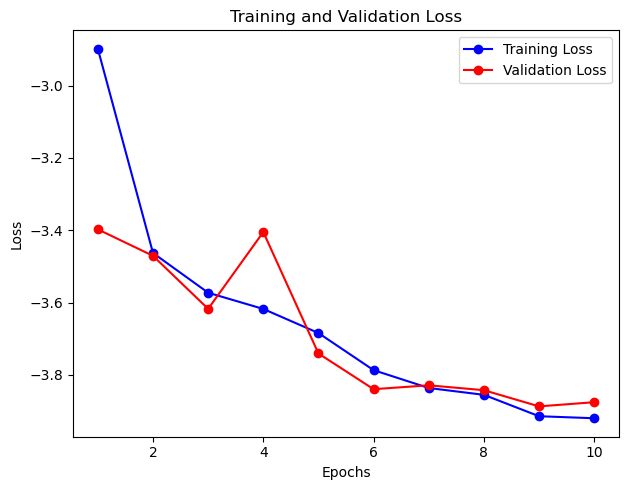

In [ ]:
UMSI_ueyes.compile(optimizer=opt, loss = combined_loss_UEyes, metrics=combined_metrics)
history = UMSI_ueyes.fit(train_data_gen, validation_data=valid_data_gen, epochs=10, steps_per_epoch=len(train_data_gen)) #TODO: why does Sim, NSS, CC approach 0 or nan?? # Train the model and capture the history
plot_learning_curve(history)

### Evaluate 'UMSI_ueyes's Performance on Training Data VS Test Data

##### Compare Performance Across Various Metrics

In [ ]:
train_test_performance(UMSI_ueyes)

,loss,mse,mae,auc_judd,auc_PR,nss,information_gain,similarity,correlation_coefficient,cosine_similarity,kl_divergence
Train,-3.875916004180908,0.020615000277758,0.114977404475212,0.597707211971283,0.656381011009216,1.182100653648376,0.076107852160931,0.412513881921768,0.626546025276184,0.520782887935638,-0.101332969963551
Test,-3.624666929244995,0.020615475252271,0.116767056286335,0.597077429294586,0.655903697013855,1.092393994331360,0.078254476189613,0.396597951650620,0.580388367176056,0.513036549091339,-0.096132241189480


##### Compare Model's Predicted Maps with Ground Truth Maps with Training and Test Data

2025-03-10 02:12:02.957856: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


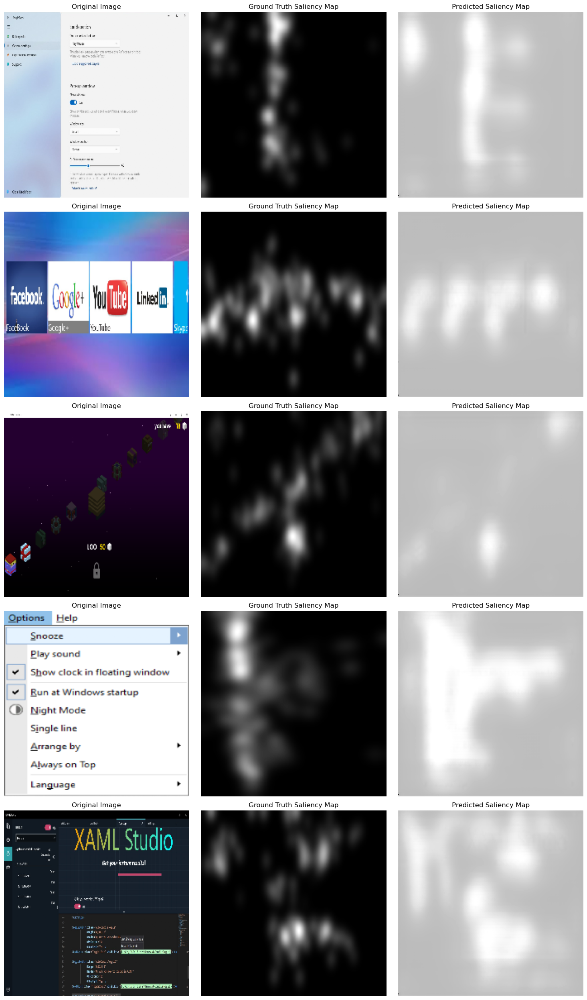

In [ ]:
visualize_results(UMSI_ueyes, train_data_gen, num_samples=5) # 5 random traning examples

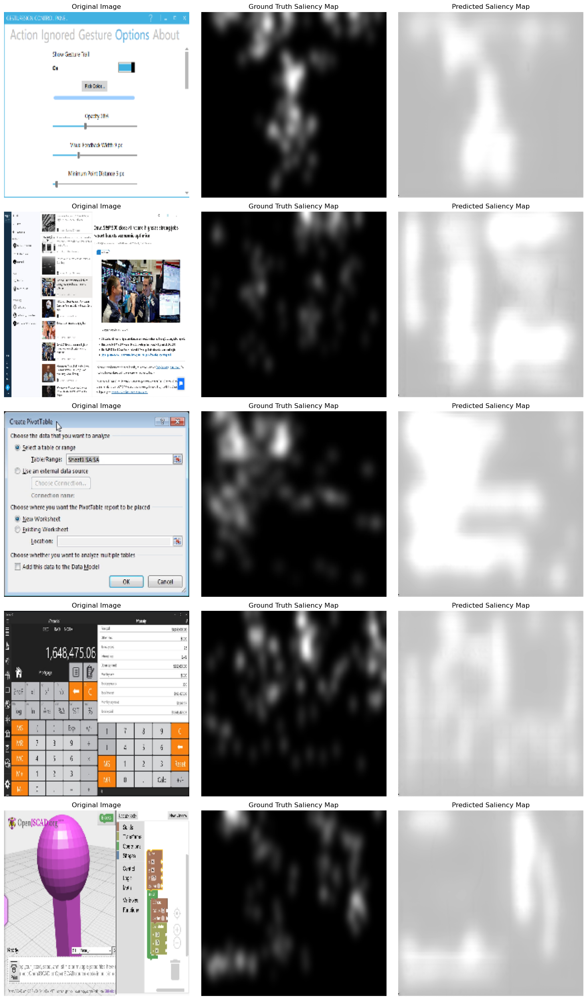

In [ ]:
visualize_results(UMSI_ueyes, test_data_gen, num_samples=5) # 5 random test examples

### Train 2 models 'UMSI_mse' and 'UMSI_mae' for 10 epochs (no batch training) using only MSE or MAE loss, respectively
They are trained with 50 samples and validated on 10 samples instead of the full dataset, just to get a sense of how the two models compare.

In [136]:
# Build the models
UMSI_mse = UMSI_simple(input_shape=(224, 224, 3))
UMSI_mae = UMSI_simple(input_shape=(224, 224, 3))

Epoch 1/10


2025-03-10 02:36:01.120368: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


50/50 [==============================] - ETA: 0s - loss: 0.0337 - accuracy: 0.4164 - auc_judd: 0.5752 - auc_PR: 0.6459 - information_gain: -5.0866 - similarity: 0.0148 - kl_divergence: 1.1376

2025-03-10 02:36:14.691275: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


50/50 [==============================] - 18s 296ms/step - loss: 0.0337 - accuracy: 0.4164 - auc_judd: 0.5752 - auc_PR: 0.6459 - information_gain: -5.0866 - similarity: 0.0148 - kl_divergence: 1.1376 - val_loss: 0.0257 - val_accuracy: 0.4198 - val_auc_judd: 0.5741 - val_auc_PR: 0.6454 - val_information_gain: -5.2998 - val_similarity: 0.0000e+00 - val_kl_divergence: 1.1143
Epoch 2/10
50/50 [==============================] - 14s 272ms/step - loss: 0.0275 - accuracy: 0.4229 - auc_judd: 0.5730 - auc_PR: 0.6449 - information_gain: -5.2998 - similarity: 0.0000e+00 - kl_divergence: 1.1930 - val_loss: 0.0257 - val_accuracy: 0.4198 - val_auc_judd: 0.5720 - val_auc_PR: 0.6444 - val_information_gain: -5.2998 - val_similarity: 0.0000e+00 - val_kl_divergence: 1.1143
Epoch 3/10
50/50 [==============================] - 14s 274ms/step - loss: 0.0275 - accuracy: 0.4229 - auc_judd: 0.5707 - auc_PR: 0.6439 - information_gain: -5.2998 - similarity: 0.0000e+00 - kl_divergence: 1.1930 - val_loss: 0.0257 - va

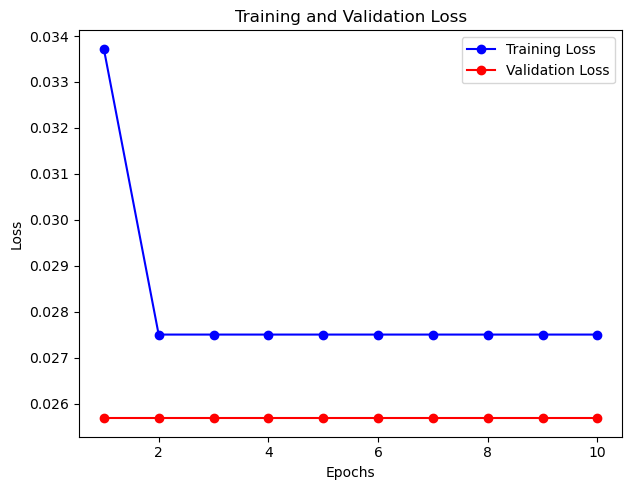

In [137]:
# Train the model using MAE loss
UMSI_mse.compile(optimizer=opt, loss = 'mse', metrics=['accuracy', auc_judd, auc_PR, information_gain, similarity, kl_divergence])
history = UMSI_mse.fit(train_data_gen, validation_data=valid_data_gen, epochs=10, steps_per_epoch=len(train_data_gen)) # Train the model and capture the history
plot_learning_curve(history)

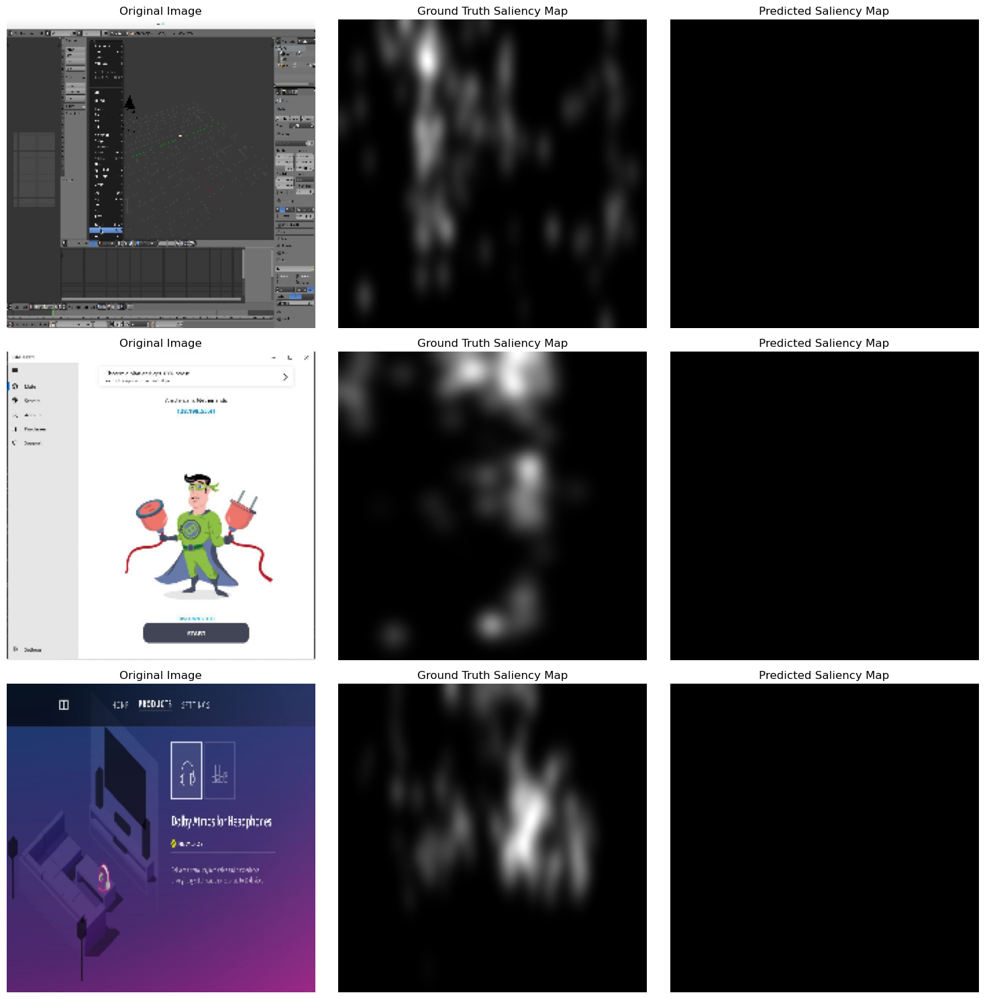

In [139]:
visualize_results(UMSI_mse, train_data_gen, num_samples=3) # 3 random test examples

Epoch 1/10


2025-03-10 02:39:38.272793: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


50/50 [==============================] - ETA: 0s - loss: 0.0934 - accuracy: 0.4135 - auc_judd: 0.5568 - auc_PR: 0.6369 - information_gain: -5.0882 - similarity: 0.0150 - kl_divergence: 1.1413

2025-03-10 02:39:52.352540: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


50/50 [==============================] - 18s 299ms/step - loss: 0.0934 - accuracy: 0.4135 - auc_judd: 0.5568 - auc_PR: 0.6369 - information_gain: -5.0882 - similarity: 0.0150 - kl_divergence: 1.1413 - val_loss: 0.0755 - val_accuracy: 0.4198 - val_auc_judd: 0.5561 - val_auc_PR: 0.6365 - val_information_gain: -5.2998 - val_similarity: 0.0000e+00 - val_kl_divergence: 1.1143
Epoch 2/10
50/50 [==============================] - 14s 278ms/step - loss: 0.0807 - accuracy: 0.4229 - auc_judd: 0.5553 - auc_PR: 0.6361 - information_gain: -5.2998 - similarity: 0.0000e+00 - kl_divergence: 1.1930 - val_loss: 0.0755 - val_accuracy: 0.4198 - val_auc_judd: 0.5547 - val_auc_PR: 0.6357 - val_information_gain: -5.2998 - val_similarity: 0.0000e+00 - val_kl_divergence: 1.1143
Epoch 3/10
50/50 [==============================] - 14s 281ms/step - loss: 0.0807 - accuracy: 0.4229 - auc_judd: 0.5539 - auc_PR: 0.6354 - information_gain: -5.2998 - similarity: 0.0000e+00 - kl_divergence: 1.1930 - val_loss: 0.0755 - va

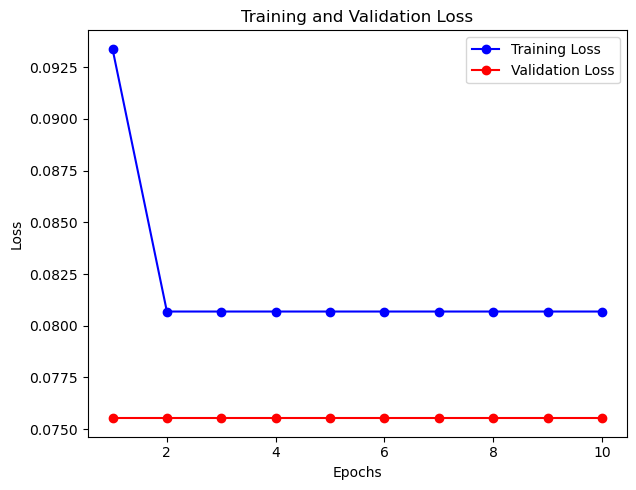

In [140]:
# Train the model using MAE loss
UMSI_mae.compile(optimizer=opt, loss = 'mae', metrics=['accuracy', auc_judd, auc_PR, information_gain, similarity, kl_divergence])
history = UMSI_mae.fit(train_data_gen, validation_data=valid_data_gen, epochs=10, steps_per_epoch=len(train_data_gen)) # Train the model and capture the history
plot_learning_curve(history)

2025-03-10 02:42:14.819662: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


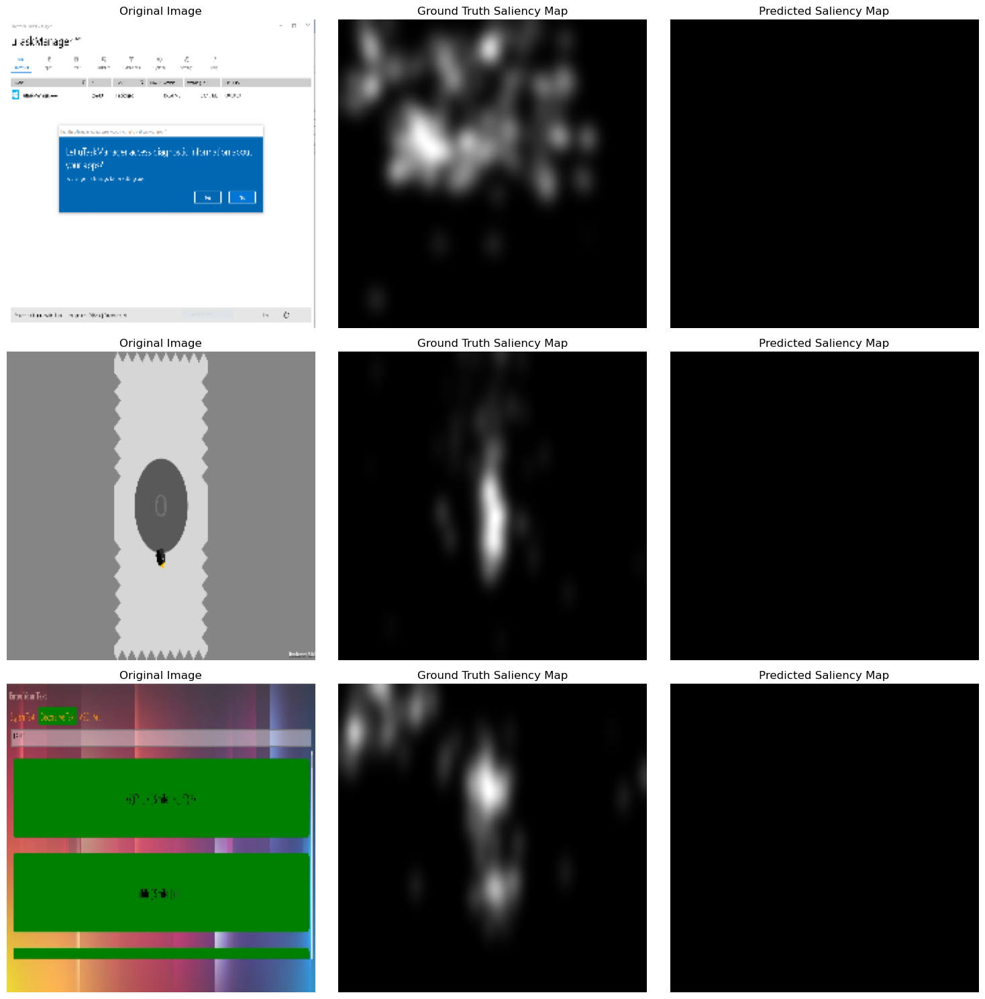

In [141]:
visualize_results(UMSI_mae, train_data_gen, num_samples=3) # 3 random test examples

In [142]:
# Compare the two models' performances across different metrics
print('Performance of model trained with MSE loss:')
display(train_test_performance(UMSI_mse))
print('Performance of model trained with MAE loss:')
display(train_test_performance(UMSI_mae))

Performance of model trained with MSE loss:


,loss,accuracy,auc_judd,auc_PR,information_gain,similarity,kl_divergence
Train,0.025681290775537,0.419774383306503,0.557589173316956,0.637371718883514,-5.299808502197266,0.000000000000000,1.114328145980835
Test,0.023258181288838,0.456881761550903,0.544835388660431,0.630239367485046,-5.299808502197266,0.000000000000000,1.044907212257385


Performance of model trained with MAE loss:


,loss,accuracy,auc_judd,auc_PR,information_gain,similarity,kl_divergence
Train,0.075530871748924,0.419774383306503,0.545007586479187,0.630341112613678,-5.299808502197266,0.000000000000000,1.114328145980835
Test,0.070909962058067,0.456881761550903,0.544754743576050,0.630132079124451,-5.299808502197266,0.000000000000000,1.044907212257385


Epoch 1/10


2025-03-10 02:45:37.817040: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


50/50 [==============================] - ETA: 0s - loss: 0.2357 - accuracy: 0.3847 - auc_judd: 0.5440 - auc_PR: 0.6286 - information_gain: -2.3439 - similarity: 0.1971 - kl_divergence: 0.5260

2025-03-10 02:45:49.377202: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


50/50 [==============================] - 16s 239ms/step - loss: 0.2357 - accuracy: 0.3847 - auc_judd: 0.5440 - auc_PR: 0.6286 - information_gain: -2.3439 - similarity: 0.1971 - kl_divergence: 0.5260 - val_loss: 0.0757 - val_accuracy: 0.4198 - val_auc_judd: 0.5433 - val_auc_PR: 0.6279 - val_information_gain: -5.2905 - val_similarity: 5.8813e-04 - val_kl_divergence: 1.1131
Epoch 2/10
50/50 [==============================] - 14s 274ms/step - loss: 0.0807 - accuracy: 0.4229 - auc_judd: 0.5427 - auc_PR: 0.6276 - information_gain: -5.2972 - similarity: 2.1807e-04 - kl_divergence: 1.1927 - val_loss: 0.0756 - val_accuracy: 0.4198 - val_auc_judd: 0.5423 - val_auc_PR: 0.6273 - val_information_gain: -5.2971 - val_similarity: 2.6996e-04 - val_kl_divergence: 1.1141
Epoch 3/10
50/50 [==============================] - 14s 273ms/step - loss: 0.0807 - accuracy: 0.4229 - auc_judd: 0.5418 - auc_PR: 0.6271 - information_gain: -5.2980 - similarity: 1.3524e-04 - kl_divergence: 1.1928 - val_loss: 0.0756 - va

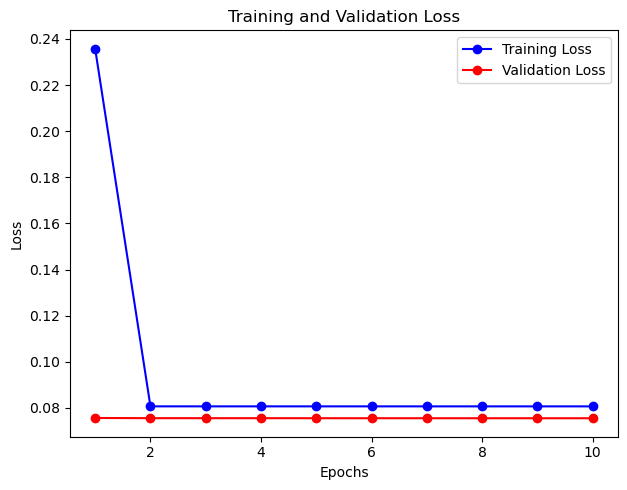

In [145]:
# Use the Adam optimizer with a lower learning rate of 0.0001 ????
opt = Adam(learning_rate=0.0001)

# Train the model using MAE loss
UMSI_mae_ = UMSI_simple(input_shape=(224, 224, 3))
UMSI_mae_.compile(optimizer=opt, loss = 'mae', metrics=['accuracy', auc_judd, auc_PR, information_gain, similarity, kl_divergence])
history = UMSI_mae_.fit(train_data_gen, validation_data=valid_data_gen, epochs=10, steps_per_epoch=len(train_data_gen)) # Train the model and capture the history
plot_learning_curve(history)

2025-03-10 02:48:17.995686: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


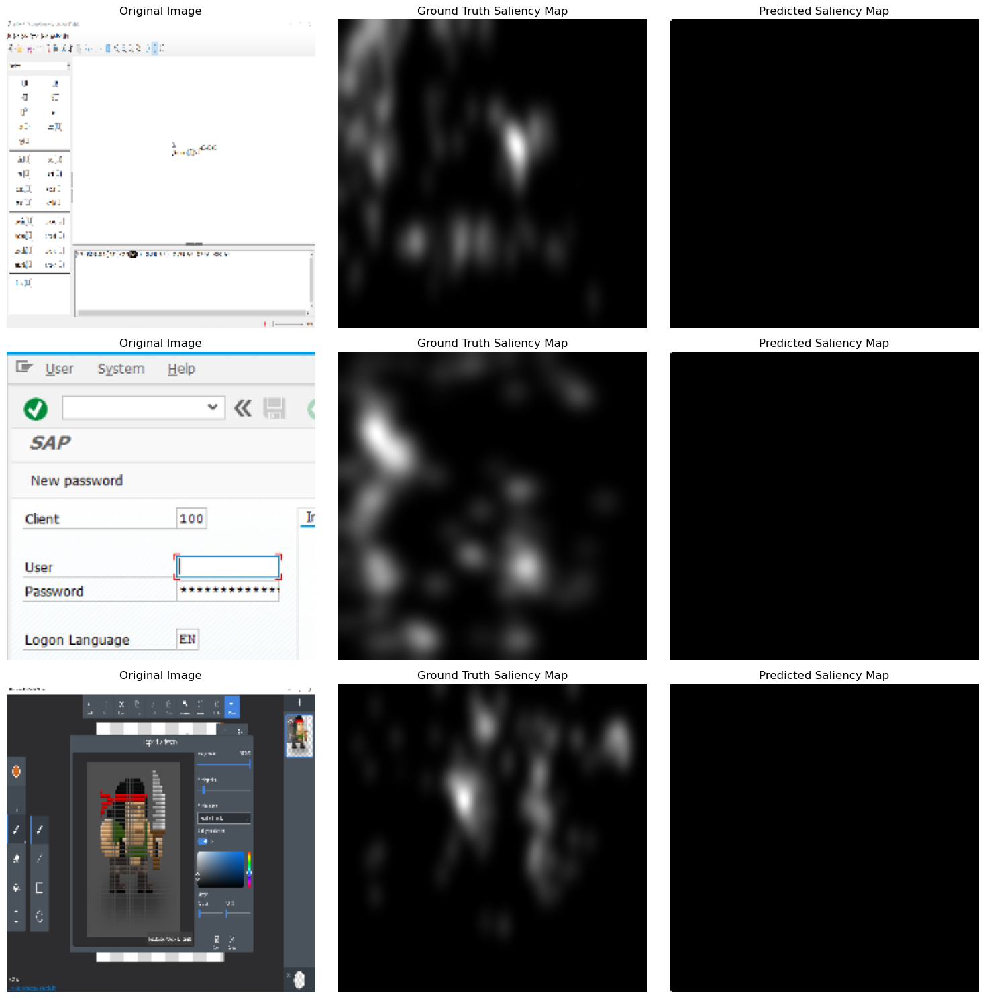

In [146]:
visualize_results(UMSI_mae_, train_data_gen, num_samples=3) # 3 random test examples

Epoch 1/4


2025-03-10 02:50:32.985168: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


50/50 [==============================] - ETA: 0s - loss: 0.0886 - accuracy: 0.4145 - auc_judd: 0.5322 - auc_PR: 0.6195 - information_gain: -5.1930 - similarity: 0.0081 - kl_divergence: 1.1712

2025-03-10 02:50:47.239666: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


50/50 [==============================] - 20s 302ms/step - loss: 0.0886 - accuracy: 0.4145 - auc_judd: 0.5322 - auc_PR: 0.6195 - information_gain: -5.1930 - similarity: 0.0081 - kl_divergence: 1.1712 - val_loss: 0.0755 - val_accuracy: 0.4198 - val_auc_judd: 0.5319 - val_auc_PR: 0.6193 - val_information_gain: -5.2998 - val_similarity: 0.0000e+00 - val_kl_divergence: 1.1143
Epoch 2/4
50/50 [==============================] - 14s 276ms/step - loss: 0.0807 - accuracy: 0.4229 - auc_judd: 0.5315 - auc_PR: 0.6191 - information_gain: -5.2998 - similarity: 0.0000e+00 - kl_divergence: 1.1930 - val_loss: 0.0755 - val_accuracy: 0.4198 - val_auc_judd: 0.5313 - val_auc_PR: 0.6189 - val_information_gain: -5.2998 - val_similarity: 0.0000e+00 - val_kl_divergence: 1.1143
Epoch 3/4
50/50 [==============================] - 14s 276ms/step - loss: 0.0807 - accuracy: 0.4229 - auc_judd: 0.5310 - auc_PR: 0.6187 - information_gain: -5.2998 - similarity: 0.0000e+00 - kl_divergence: 1.1930 - val_loss: 0.0755 - val_

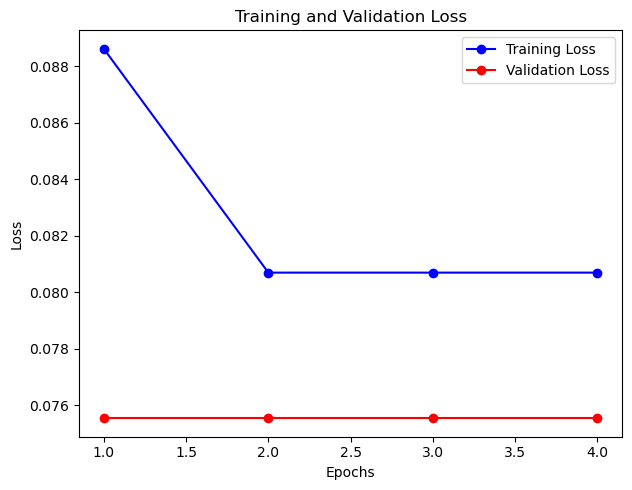

In [148]:
# Use the Adam optimizer with a higher learning rate ????
opt = Adam(learning_rate=0.01)

# Train the model using MAE loss
UMSI_mae_ = UMSI_simple(input_shape=(224, 224, 3))
UMSI_mae_.compile(optimizer=opt, loss = 'mae', metrics=['accuracy', auc_judd, auc_PR, information_gain, similarity, kl_divergence])
history = UMSI_mae_.fit(train_data_gen, validation_data=valid_data_gen, epochs=4, steps_per_epoch=len(train_data_gen)) # Train the model and capture the history
plot_learning_curve(history)

In [ ]:
# pick the MSE or MAE model, then train for 40 more epochs with the combined loss
#opt = Adam(learning_rate=0.0001)
#UMSI_simple.compile(optimizer=opt, loss = combined_loss, metrics=combined_metrics)

#history = UMSI_simple.fit(train_data_gen, validation_data=valid_data_gen, epochs=40, batch_size = 16) #, steps_per_epoch=len(train_data_gen)) # Train the model and capture the history
#plot_learning_curve(history)

Epoch 1/10


2025-03-10 02:54:23.590248: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


50/50 [==============================] - ETA: 0s - loss: -0.7459 - mse: 0.1941 - mae: 0.4237 - auc_judd: 0.5299 - auc_PR: 0.6174 - nss: 0.1452 - information_gain: 0.0030 - similarity: 0.3930 - correlation_coefficient: 0.0778 - cosine_similarity: 0.2027 - kl_divergence: -0.0867

2025-03-10 02:54:39.291985: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


50/50 [==============================] - 22s 277ms/step - loss: -0.7459 - mse: 0.1941 - mae: 0.4237 - auc_judd: 0.5299 - auc_PR: 0.6174 - nss: 0.1452 - information_gain: 0.0030 - similarity: 0.3930 - correlation_coefficient: 0.0778 - cosine_similarity: 0.2027 - kl_divergence: -0.0867 - val_loss: -1.0130 - val_mse: 0.1813 - val_mae: 0.4126 - val_auc_judd: 0.5295 - val_auc_PR: 0.6161 - val_nss: 0.5715 - val_information_gain: 0.0182 - val_similarity: 0.3976 - val_correlation_coefficient: 0.3128 - val_cosine_similarity: 0.4859 - val_kl_divergence: -0.0909
Epoch 2/10
50/50 [==============================] - 12s 247ms/step - loss: -1.1005 - mse: 0.2270 - mae: 0.4536 - auc_judd: 0.5293 - auc_PR: 0.6155 - nss: 0.8315 - information_gain: 0.0546 - similarity: 0.4130 - correlation_coefficient: 0.4404 - cosine_similarity: 0.5151 - kl_divergence: -0.0912 - val_loss: -1.1639 - val_mse: 0.1701 - val_mae: 0.3994 - val_auc_judd: 0.5291 - val_auc_PR: 0.6151 - val_nss: 0.7753 - val_information_gain: 0.01

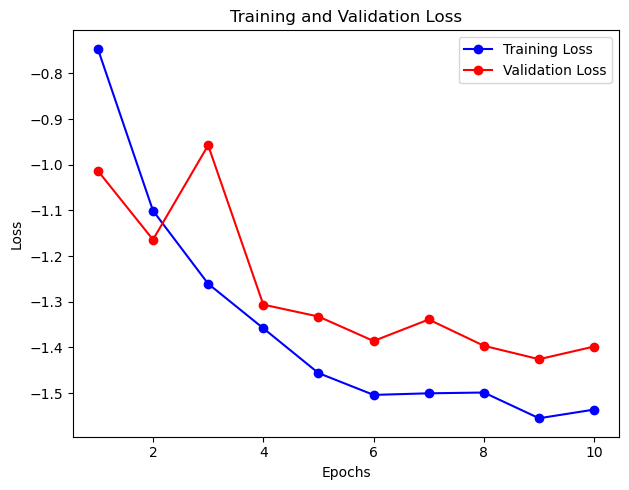

In [150]:
opt = Adam(learning_rate=0.001)

# Train the model using the same combined loss as the one in UEyes.ipynb, just with a smaller set of training data and less epochs
UMSI_ueyes_2 = UMSI_simple(input_shape=(224, 224, 3))
UMSI_ueyes_2.compile(optimizer=opt, loss = combined_loss_UEyes_2, metrics=combined_metrics)
history = UMSI_ueyes_2.fit(train_data_gen, validation_data=valid_data_gen, epochs=10, steps_per_epoch=len(train_data_gen)) # Train the model and capture the history
plot_learning_curve(history)

2025-03-10 02:56:19.556002: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


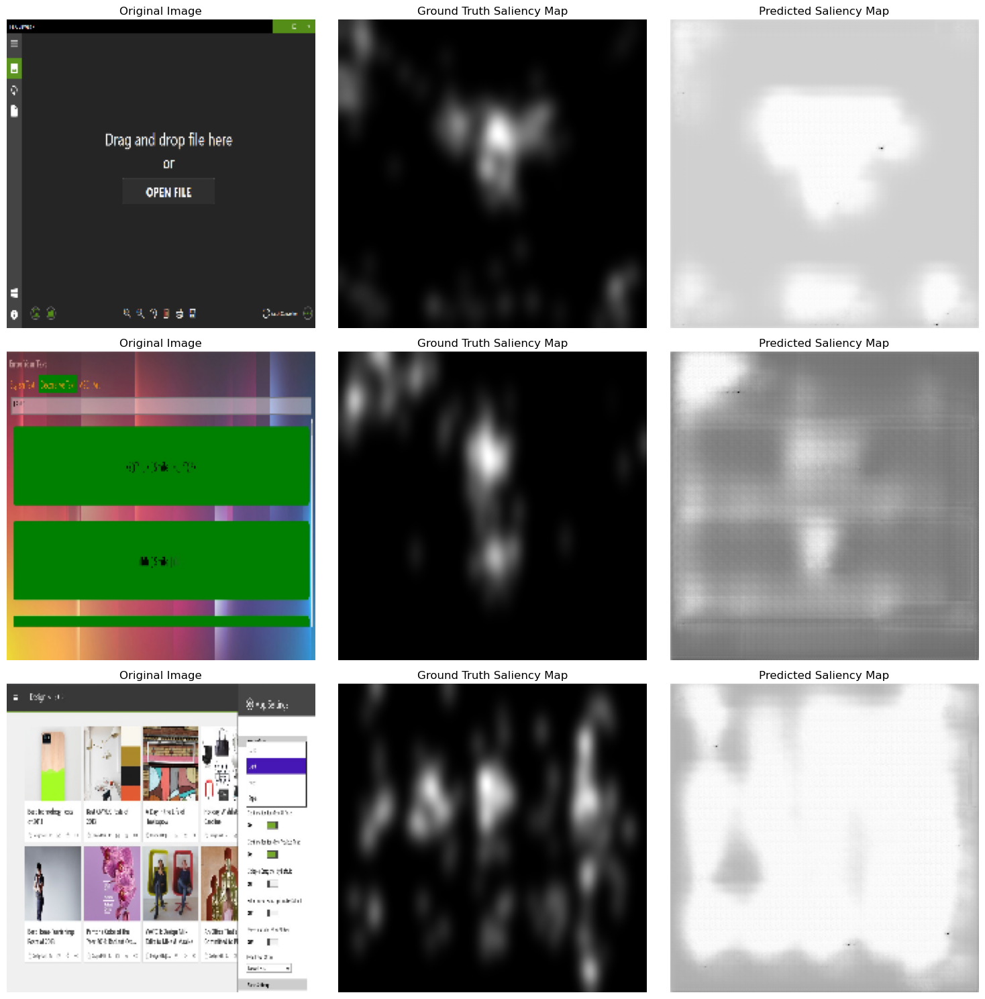

In [ ]:
visualize_results(UMSI_ueyes_2, train_data_gen, num_samples=3) # 3 random examples

In [1]:
history = UMSI_ueyes_2.fit(train_data_gen, validation_data=valid_data_gen, epochs=15, steps_per_epoch=len(train_data_gen)) # Train the model and capture the history
plot_learning_curve(history)

NameError: name 'UMSI_ueyes_2' is not defined

### Model with negative output bias

In [21]:
# Define the UMSI++ model
def UMSI_neg_bias(input_shape=(224, 224, 3)):
    # Input layer
    inputs = Input(shape=input_shape)
    
    # --------------------------
    # Encoder (Feature Extraction)
    # --------------------------
    # Block 1
    x1 = Conv2D(32, (3, 3), activation='relu', padding='same', name='block1_conv1')(inputs)
    x1 = Conv2D(32, (3, 3), activation='relu', padding='same', name='block1_conv2')(x1)
    p1 = MaxPooling2D((2, 2), name='block1_pool')(x1)
    
    # Block 2
    x2 = Conv2D(64, (3, 3), activation='relu', padding='same', name='block2_conv1')(p1)
    x2 = Conv2D(64, (3, 3), activation='relu', padding='same', name='block2_conv2')(x2)
    p2 = MaxPooling2D((2, 2), name='block2_pool')(x2)
    
    # Block 3
    x3 = Conv2D(128, (3, 3), activation='relu', padding='same', name='block3_conv1')(p2)
    x3 = Conv2D(128, (3, 3), activation='relu', padding='same', name='block3_conv2')(x3)
    p3 = MaxPooling2D((2, 2), name='block3_pool')(x3)
    
    # --------------------------
    # Bottleneck (Multi-Scale Feature Aggregation)
    # --------------------------
    bottleneck = Conv2D(256, (3, 3), activation='relu', padding='same', name='bottleneck_conv1')(p3)
    bottleneck = Conv2D(256, (3, 3), activation='relu', padding='same', name='bottleneck_conv2')(bottleneck)
    
    # --------------------------
    # Decoder (Saliency Map Reconstruction)
    # --------------------------
    # Block 4
    u4 = Conv2DTranspose(128, (3, 3), strides=(2, 2), padding='same', name='block4_deconv')(bottleneck)
    u4 = concatenate([u4, x3], name='block4_concat')
    u4 = Conv2D(128, (3, 3), activation='relu', padding='same', name='block4_conv1')(u4)
    u4 = Conv2D(128, (3, 3), activation='relu', padding='same', name='block4_conv2')(u4)
    
    # Block 5
    u5 = Conv2DTranspose(64, (3, 3), strides=(2, 2), padding='same', name='block5_deconv')(u4)
    u5 = concatenate([u5, x2], name='block5_concat')
    u5 = Conv2D(64, (3, 3), activation='relu', padding='same', name='block5_conv1')(u5)
    u5 = Conv2D(64, (3, 3), activation='relu', padding='same', name='block5_conv2')(u5)
    
    # Block 6
    u6 = Conv2DTranspose(32, (3, 3), strides=(2, 2), padding='same', name='block6_deconv')(u5)
    u6 = concatenate([u6, x1], name='block6_concat')
    u6 = Conv2D(32, (3, 3), activation='relu', padding='same', name='block6_conv1')(u6)
    u6 = Conv2D(32, (3, 3), activation='relu', padding='same', name='block6_conv2')(u6)
    
    # --------------------------
    # Saliency Output
    # --------------------------
    # Define a custom bias initializer
    negative_bias_initializer = tf.keras.initializers.Constant(-10.0)  # Adjust the value as needed
    saliency_output = Conv2D(1, (1, 1), activation='sigmoid', name='saliency_output', bias_initializer=negative_bias_initializer)(u6)
    
    # --------------------------
    # Define the Model
    # --------------------------
    model = Model(inputs, saliency_output, name='UMSI_neg_bias')  # Use a valid model name
    
    return model

Epoch 1/10


2025-03-10 03:20:26.353259: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


50/50 [==============================] - ETA: 0s - loss: -0.9491 - mse: 0.0265 - mae: 0.0792 - auc_judd: 0.5778 - auc_PR: 0.6558 - nss: 0.4198 - information_gain: 0.0187 - similarity: 0.4074 - correlation_coefficient: 0.2295 - cosine_similarity: 0.5013 - kl_divergence: -0.0766

2025-03-10 03:20:45.885564: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


50/50 [==============================] - 26s 381ms/step - loss: -0.9491 - mse: 0.0265 - mae: 0.0792 - auc_judd: 0.5778 - auc_PR: 0.6558 - nss: 0.4198 - information_gain: 0.0187 - similarity: 0.4074 - correlation_coefficient: 0.2295 - cosine_similarity: 0.5013 - kl_divergence: -0.0766 - val_loss: -1.2953 - val_mse: 0.0288 - val_mae: 0.0872 - val_auc_judd: 0.5705 - val_auc_PR: 0.6527 - val_nss: 0.7015 - val_information_gain: 0.0432 - val_similarity: 0.4389 - val_correlation_coefficient: 0.3948 - val_cosine_similarity: 0.5348 - val_kl_divergence: -0.0973
Epoch 2/10
50/50 [==============================] - 15s 305ms/step - loss: -1.2208 - mse: 0.0265 - mae: 0.0792 - auc_judd: 0.5650 - auc_PR: 0.6499 - nss: 0.7689 - information_gain: 0.0339 - similarity: 0.4149 - correlation_coefficient: 0.4084 - cosine_similarity: 0.5059 - kl_divergence: -0.0863 - val_loss: -1.3802 - val_mse: 0.0288 - val_mae: 0.0872 - val_auc_judd: 0.5592 - val_auc_PR: 0.6474 - val_nss: 0.7258 - val_information_gain: 0.03

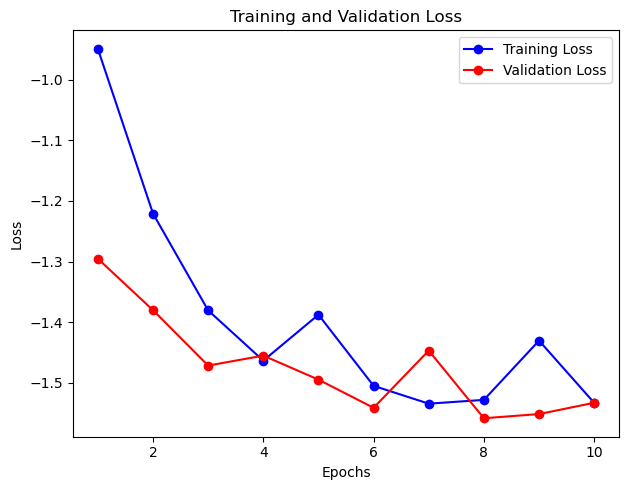

In [22]:
opt = Adam(learning_rate=0.001)

# Train the model using the same combined loss as the one in UEyes.ipynb, just with a smaller set of training data and less epochs
UMSI_neg_bias_ = UMSI_neg_bias(input_shape=(224, 224, 3))
UMSI_neg_bias_.compile(optimizer=opt, loss = combined_loss_UEyes_2, metrics=combined_metrics)
history = UMSI_neg_bias_.fit(train_data_gen, validation_data=valid_data_gen, epochs=10, steps_per_epoch=len(train_data_gen)) # Train the model and capture the history
plot_learning_curve(history)

2025-03-10 03:24:32.524309: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


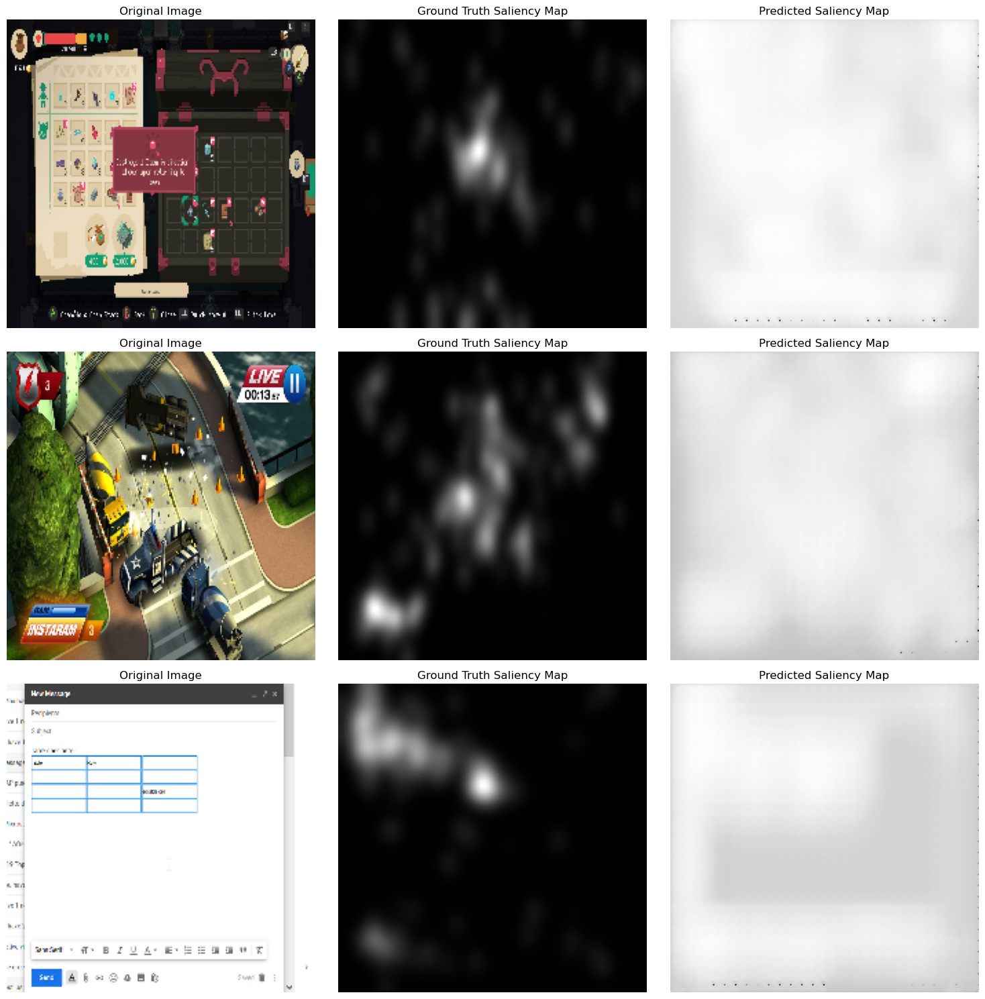

In [23]:
visualize_results(UMSI_neg_bias_, train_data_gen, num_samples=3) # 3 random examples

### Model with batch normalization layers (to combat the potentially vanishing gradient, i.e. why the models with MSE/MAE loss predict fully 0 maps?)

In [38]:
# Define the UMSI++ model
def UMSI_batch_norm(input_shape=(224, 224, 3)):
    # Input layer
    inputs = Input(shape=input_shape)
    
    # --------------------------
    # Encoder (Feature Extraction)
    # --------------------------
    # Block 1
    x1 = Conv2D(32, (3, 3), activation='relu', padding='same', name='block1_conv1')(inputs)
    x1 = BatchNormalization(name="block1_conv1_BN")(x1) # added
    x1 = Conv2D(32, (3, 3), activation='relu', padding='same', name='block1_conv2')(x1)
    x1 = BatchNormalization(name="block1_conv2_BN")(x1) # added
    p1 = MaxPooling2D((2, 2), name='block1_pool')(x1)
    
    # Block 2
    p1 = BatchNormalization(name="block1_pool_BN")(p1) # added
    x2 = Conv2D(64, (3, 3), activation='relu', padding='same', name='block2_conv1')(p1)
    x2 = BatchNormalization(name="block2_conv1_BN")(x2) # added
    x2 = Conv2D(64, (3, 3), activation='relu', padding='same', name='block2_conv2')(x2)
    x2 = BatchNormalization(name="block2_conv2_BN")(x2) # added
    p2 = MaxPooling2D((2, 2), name='block2_pool')(x2)
    
    # Block 3
    p2 = BatchNormalization(name="block2_pool_BN")(p2) # added
    x3 = Conv2D(128, (3, 3), activation='relu', padding='same', name='block3_conv1')(p2)
    x3 = BatchNormalization(name="block3_conv1_BN")(x3) # added
    x3 = Conv2D(128, (3, 3), activation='relu', padding='same', name='block3_conv2')(x3)
    x3 = BatchNormalization(name="block3_conv2_BN")(x3) # added
    p3 = MaxPooling2D((2, 2), name='block3_pool')(x3)
    
    # --------------------------
    # Bottleneck (Multi-Scale Feature Aggregation)
    # --------------------------
    p3 = BatchNormalization(name="block3_pool_BN")(p3) # added
    bottleneck = Conv2D(256, (3, 3), activation='relu', padding='same', name='bottleneck_conv1')(p3)
    bottleneck = Conv2D(256, (3, 3), activation='relu', padding='same', name='bottleneck_conv2')(bottleneck)
    
    # --------------------------
    # Decoder (Saliency Map Reconstruction)
    # --------------------------
    # Block 4
    u4 = BatchNormalization(name="bottleneck_conv2_BN")(bottleneck) # added
    u4 = Conv2DTranspose(128, (3, 3), strides=(2, 2), padding='same', name='block4_deconv')(u4)
    u4 = concatenate([u4, x3], name='block4_concat')
    u4 = BatchNormalization(name="block4_concat_BN")(u4) # added
    u4 = Conv2D(128, (3, 3), activation='relu', padding='same', name='block4_conv1')(u4)
    u4 = Conv2D(128, (3, 3), activation='relu', padding='same', name='block4_conv2')(u4)
    
    # Block 5
    u5 = BatchNormalization(name="block4_conv2_BN")(u4) # added
    u5 = Conv2DTranspose(64, (3, 3), strides=(2, 2), padding='same', name='block5_deconv')(u5)
    u5 = concatenate([u5, x2], name='block5_concat')
    u5 = BatchNormalization(name="block5_concat_BN")(u5) # added
    u5 = Conv2D(64, (3, 3), activation='relu', padding='same', name='block5_conv1')(u5)
    u5 = Conv2D(64, (3, 3), activation='relu', padding='same', name='block5_conv2')(u5)
    
    # Block 6
    u6 = BatchNormalization(name="block5_conv2_BN")(u5) # added
    u6 = Conv2DTranspose(32, (3, 3), strides=(2, 2), padding='same', name='block6_deconv')(u6)
    u6 = concatenate([u6, x1], name='block6_concat')
    u6 = BatchNormalization(name="block6_concat_BN")(u6) # added
    u6 = Conv2D(32, (3, 3), activation='relu', padding='same', name='block6_conv1')(u6)
    u6 = Conv2D(32, (3, 3), activation='relu', padding='same', name='block6_conv2')(u6)
    
    # --------------------------
    # Saliency Output
    # --------------------------
    saliency_output = Conv2D(1, (1, 1), activation='sigmoid', name='saliency_output')(u6)
    
    # --------------------------
    # Define the Model
    # --------------------------
    model = Model(inputs, saliency_output, name='UMSI_neg_bias')  # Use a valid model name
    
    return model

Epoch 1/10


2025-03-10 09:10:07.672722: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


50/50 [==============================] - ETA: 0s - loss: 0.0999 - mse: 0.0340 - mae: 0.0999 - auc_judd: 0.6175 - auc_PR: 0.7003 - nss: 0.3961 - information_gain: -1.1668 - similarity: 0.3662 - correlation_coefficient: 0.2195 - cosine_similarity: 0.4486 - kl_divergence: 0.2776

2025-03-10 09:10:21.529581: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


50/50 [==============================] - 22s 294ms/step - loss: 0.0999 - mse: 0.0340 - mae: 0.0999 - auc_judd: 0.6175 - auc_PR: 0.7003 - nss: 0.3961 - information_gain: -1.1668 - similarity: 0.3662 - correlation_coefficient: 0.2195 - cosine_similarity: 0.4486 - kl_divergence: 0.2776 - val_loss: 0.0872 - val_mse: 0.0288 - val_mae: 0.0872 - val_auc_judd: 0.6172 - val_auc_PR: 0.7002 - val_nss: -0.0682 - val_information_gain: -1.7358 - val_similarity: 0.1104 - val_correlation_coefficient: -0.0416 - val_cosine_similarity: 0.0434 - val_kl_divergence: 0.5870
Epoch 2/10
50/50 [==============================] - 12s 229ms/step - loss: 0.0696 - mse: 0.0193 - mae: 0.0696 - auc_judd: 0.6174 - auc_PR: 0.7003 - nss: 0.7707 - information_gain: -0.6464 - similarity: 0.4661 - correlation_coefficient: 0.4150 - cosine_similarity: 0.5486 - kl_divergence: 0.2428 - val_loss: 0.0872 - val_mse: 0.0288 - val_mae: 0.0872 - val_auc_judd: 0.6177 - val_auc_PR: 0.7005 - val_nss: -0.0175 - val_information_gain: -5.21

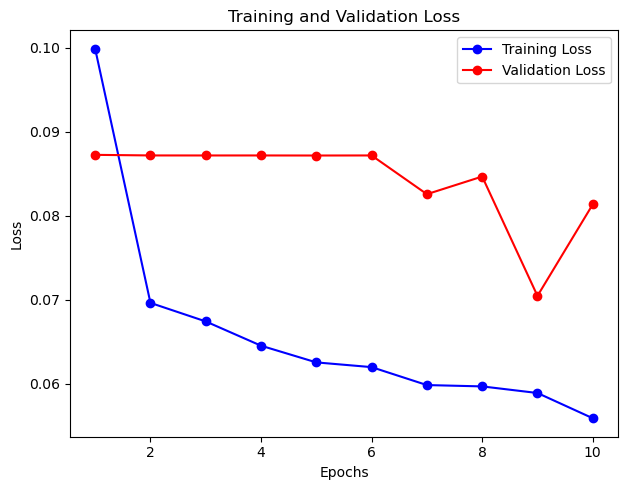

In [39]:
opt = Adam(learning_rate=0.001)

# Train the model using the same combined loss as the one in UEyes.ipynb, just with a smaller set of training data and less epochs
UMSI_batch_norm_ = UMSI_batch_norm(input_shape=(224, 224, 3))
UMSI_batch_norm_.compile(optimizer=opt, loss = 'mae', metrics=combined_metrics)
history = UMSI_batch_norm_.fit(train_data_gen, validation_data=valid_data_gen, epochs=10, steps_per_epoch=len(train_data_gen)) # Train the model and capture the history
plot_learning_curve(history)

2025-03-10 09:12:14.466518: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


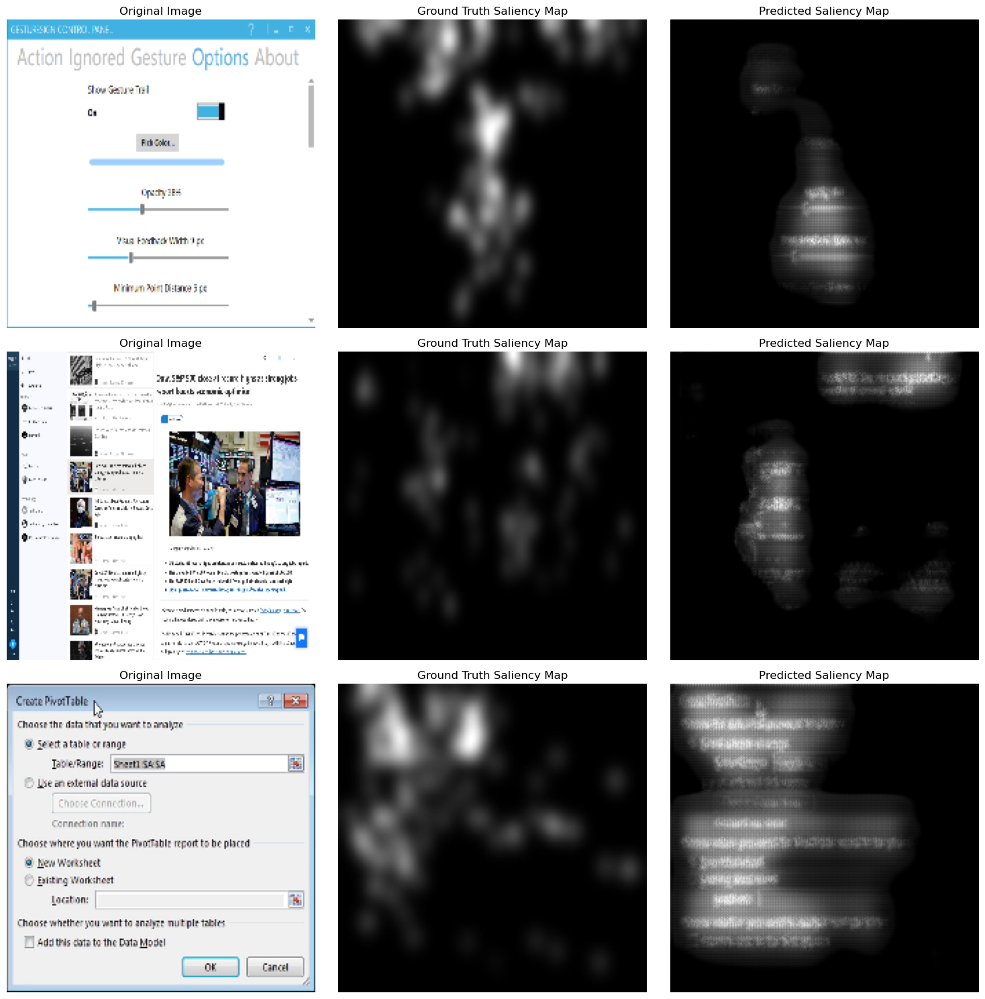

In [40]:
visualize_results(UMSI_batch_norm_, test_data_gen, num_samples=3) # 3 random examples

Epoch 1/10
50/50 [==============================] - 10s 190ms/step - loss: 0.0564 - mse: 0.0127 - mae: 0.0564 - auc_judd: 0.6283 - auc_PR: 0.7090 - nss: 1.2324 - information_gain: 0.1478 - similarity: 0.6120 - correlation_coefficient: 0.6546 - cosine_similarity: 0.7389 - kl_divergence: 0.1270 - val_loss: 0.0714 - val_mse: 0.0172 - val_mae: 0.0714 - val_auc_judd: 0.6291 - val_auc_PR: 0.7097 - val_nss: 0.8578 - val_information_gain: -0.8354 - val_similarity: 0.4949 - val_correlation_coefficient: 0.4987 - val_cosine_similarity: 0.6235 - val_kl_divergence: 0.2493
Epoch 2/10
50/50 [==============================] - 9s 180ms/step - loss: 0.0551 - mse: 0.0120 - mae: 0.0551 - auc_judd: 0.6300 - auc_PR: 0.7105 - nss: 1.2491 - information_gain: 0.2497 - similarity: 0.6215 - correlation_coefficient: 0.6679 - cosine_similarity: 0.7510 - kl_divergence: 0.1062 - val_loss: 0.0693 - val_mse: 0.0165 - val_mae: 0.0693 - val_auc_judd: 0.6310 - val_auc_PR: 0.7112 - val_nss: 0.9494 - val_information_gain: 

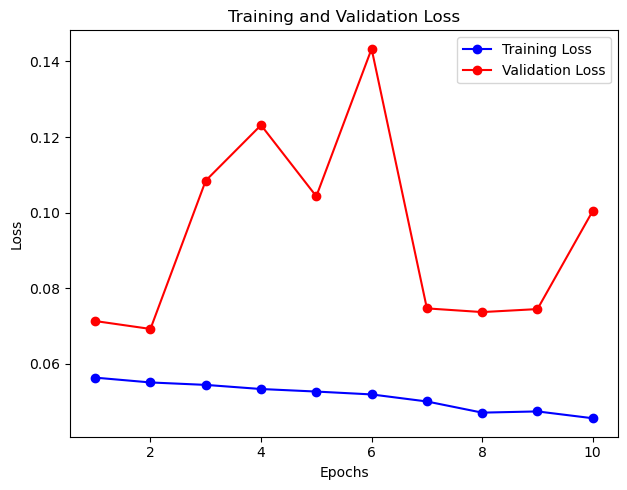

In [41]:
# train for 10 more epochs with lower learning rate upper bound (see if current model is underfitted, looks overfitted tho)
opt = Adam(learning_rate=0.0001)
history = UMSI_batch_norm_.fit(train_data_gen, validation_data=valid_data_gen, epochs=10, steps_per_epoch=len(train_data_gen)) # Train the model and capture the history
plot_learning_curve(history)

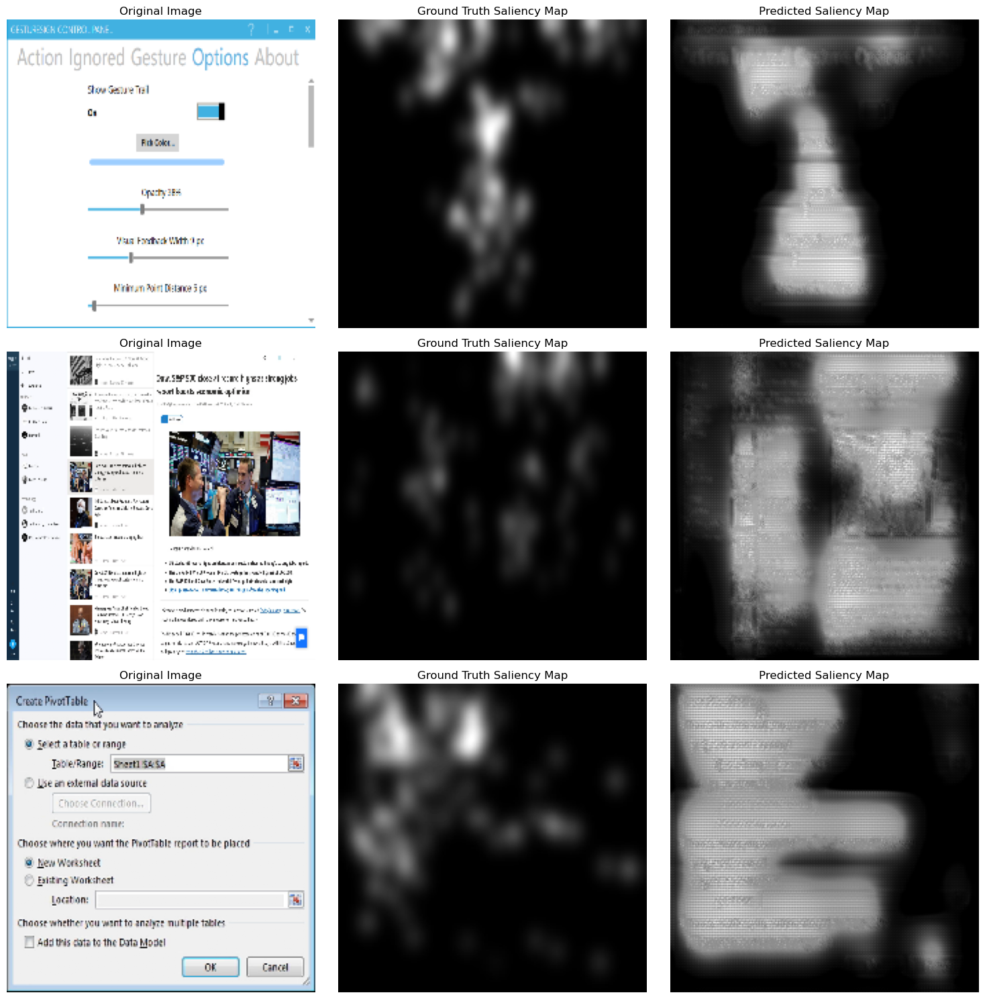

In [42]:
visualize_results(UMSI_batch_norm_, test_data_gen, num_samples=3) # 3 random examples

fixed vanishing gradient but maybe something about this architecture doesn't support the prediction task...verify by trying with the combined_loss term (which worked with the previous architecture)

Epoch 1/10


2025-03-10 09:49:12.293158: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


50/50 [==============================] - ETA: 0s - loss: -2.7646 - mse: 0.3073 - mae: 0.4953 - auc_judd: 0.6439 - auc_PR: 0.7202 - nss: 0.8255 - information_gain: 0.2603 - similarity: 0.4814 - correlation_coefficient: 0.4451 - cosine_similarity: 0.6219 - kl_divergence: -0.0842

2025-03-10 09:49:30.655263: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


50/50 [==============================] - 27s 310ms/step - loss: -2.7646 - mse: 0.3073 - mae: 0.4953 - auc_judd: 0.6439 - auc_PR: 0.7202 - nss: 0.8255 - information_gain: 0.2603 - similarity: 0.4814 - correlation_coefficient: 0.4451 - cosine_similarity: 0.6219 - kl_divergence: -0.0842 - val_loss: -0.7372 - val_mse: 0.1125 - val_mae: 0.3137 - val_auc_judd: 0.6425 - val_auc_PR: 0.7168 - val_nss: 0.0459 - val_information_gain: -0.0122 - val_similarity: 0.4016 - val_correlation_coefficient: 0.0278 - val_cosine_similarity: 0.5071 - val_kl_divergence: -0.0342
Epoch 2/10
50/50 [==============================] - 9s 176ms/step - loss: -3.2476 - mse: 0.2157 - mae: 0.4067 - auc_judd: 0.6416 - auc_PR: 0.7151 - nss: 1.0102 - information_gain: 0.3501 - similarity: 0.5052 - correlation_coefficient: 0.5474 - cosine_similarity: 0.6540 - kl_divergence: -0.0811 - val_loss: 0.2177 - val_mse: 0.0870 - val_mae: 0.2796 - val_auc_judd: 0.6403 - val_auc_PR: 0.7129 - val_nss: -0.1357 - val_information_gain: -0.0

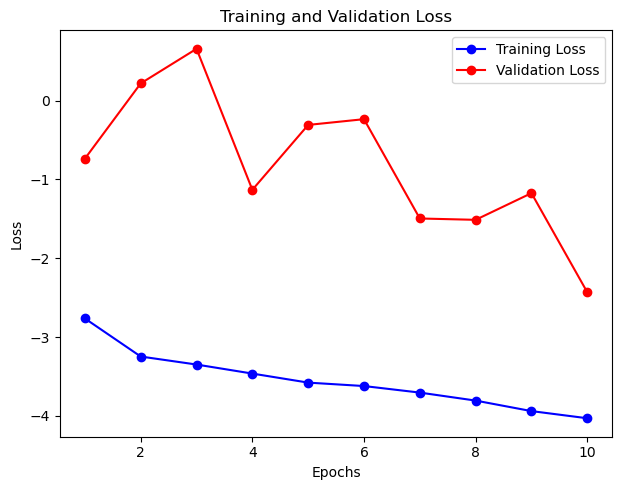

In [43]:
opt = Adam(learning_rate=0.001)

# Train the model using the same combined loss as the one in UEyes.ipynb, just with a smaller set of training data and less epochs
UMSI_batch_norm_ = UMSI_batch_norm(input_shape=(224, 224, 3))
UMSI_batch_norm_.compile(optimizer=opt, loss = combined_loss_UEyes, metrics=combined_metrics)
history = UMSI_batch_norm_.fit(train_data_gen, validation_data=valid_data_gen, epochs=10, steps_per_epoch=len(train_data_gen)) # Train the model and capture the history
plot_learning_curve(history)

2025-03-10 09:52:13.684840: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


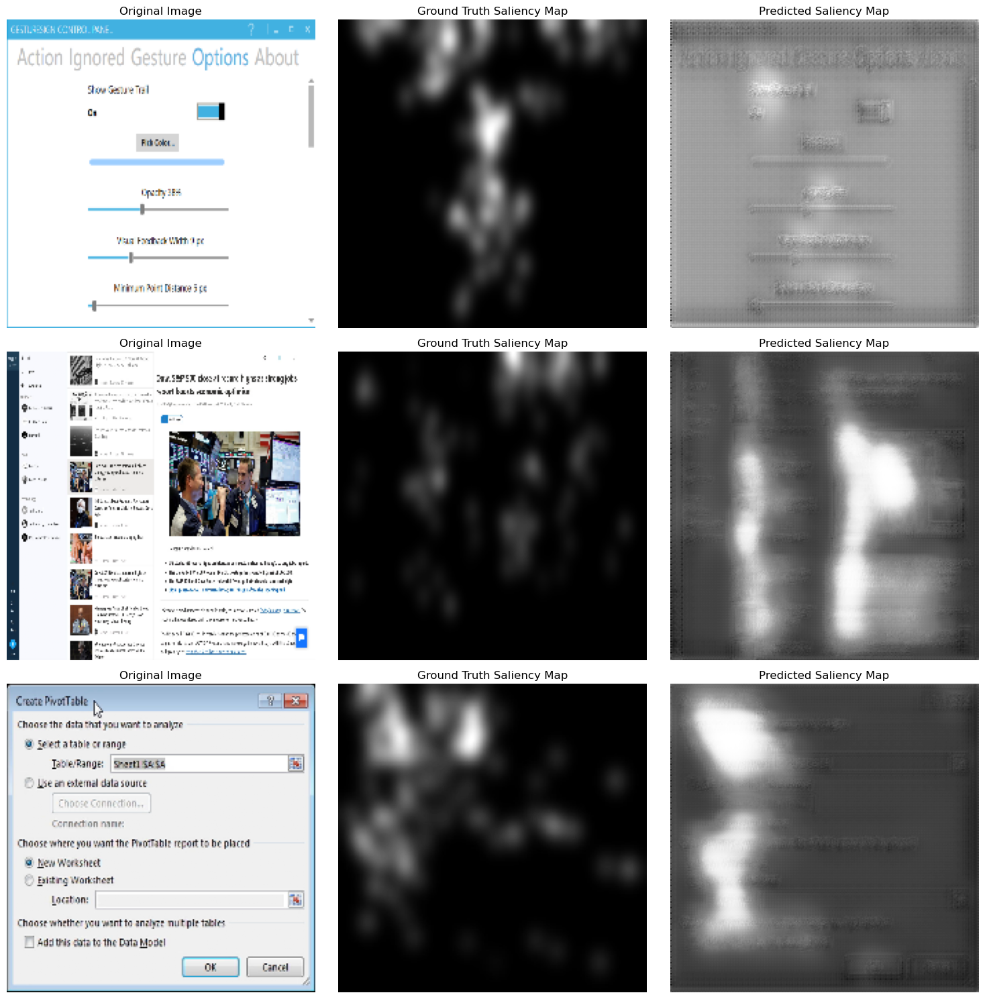

In [44]:
visualize_results(UMSI_batch_norm_, test_data_gen, num_samples=3) # 3 random examples

better than using just the MAE loss but more false positives (too white, overpredicts saliency)

Epoch 1/10


2025-03-10 09:57:16.259768: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


50/50 [==============================] - ETA: 0s - loss: -0.8765 - mse: 0.4000 - mae: 0.5894 - auc_judd: 0.6256 - auc_PR: 0.7006 - nss: 0.7258 - information_gain: 0.1720 - similarity: 0.4512 - correlation_coefficient: 0.3913 - cosine_similarity: 0.5714 - kl_divergence: -0.0914

2025-03-10 09:57:33.173413: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


50/50 [==============================] - 27s 297ms/step - loss: -0.8765 - mse: 0.4000 - mae: 0.5894 - auc_judd: 0.6256 - auc_PR: 0.7006 - nss: 0.7258 - information_gain: 0.1720 - similarity: 0.4512 - correlation_coefficient: 0.3913 - cosine_similarity: 0.5714 - kl_divergence: -0.0914 - val_loss: -0.5230 - val_mse: 0.1507 - val_mae: 0.3708 - val_auc_judd: 0.6246 - val_auc_PR: 0.6987 - val_nss: -0.0985 - val_information_gain: -0.0109 - val_similarity: 0.3985 - val_correlation_coefficient: -0.0568 - val_cosine_similarity: 0.5072 - val_kl_divergence: -0.0723
Epoch 2/10
50/50 [==============================] - 9s 172ms/step - loss: -1.0396 - mse: 0.3292 - mae: 0.5318 - auc_judd: 0.6236 - auc_PR: 0.6973 - nss: 0.8984 - information_gain: 0.2525 - similarity: 0.4706 - correlation_coefficient: 0.4864 - cosine_similarity: 0.6100 - kl_divergence: -0.0920 - val_loss: 0.9611 - val_mse: 0.0291 - val_mae: 0.1420 - val_auc_judd: 0.6228 - val_auc_PR: 0.6964 - val_nss: -0.1820 - val_information_gain: -0

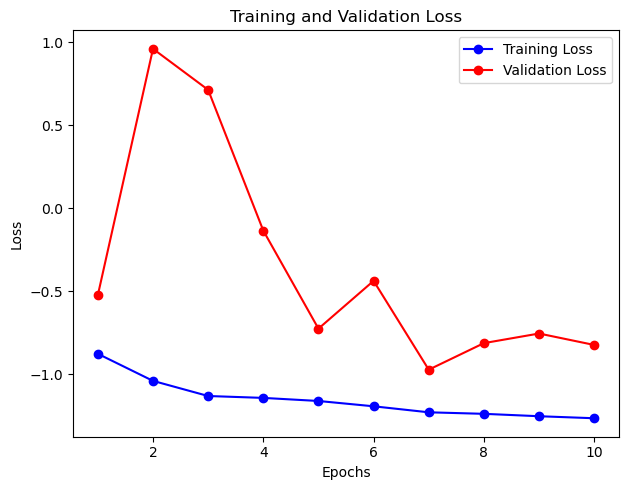

In [46]:
# Train the model using the same combined loss as the one in UEyes.ipynb, just with a smaller set of training data and less epochs
UMSI_batch_norm_ = UMSI_batch_norm(input_shape=(224, 224, 3))
UMSI_batch_norm_.compile(optimizer=opt, loss = combined_loss_UEyes_2, metrics=combined_metrics)
history = UMSI_batch_norm_.fit(train_data_gen, validation_data=valid_data_gen, epochs=10, steps_per_epoch=len(train_data_gen)) # Train the model and capture the history
plot_learning_curve(history)

2025-03-10 10:13:57.603183: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


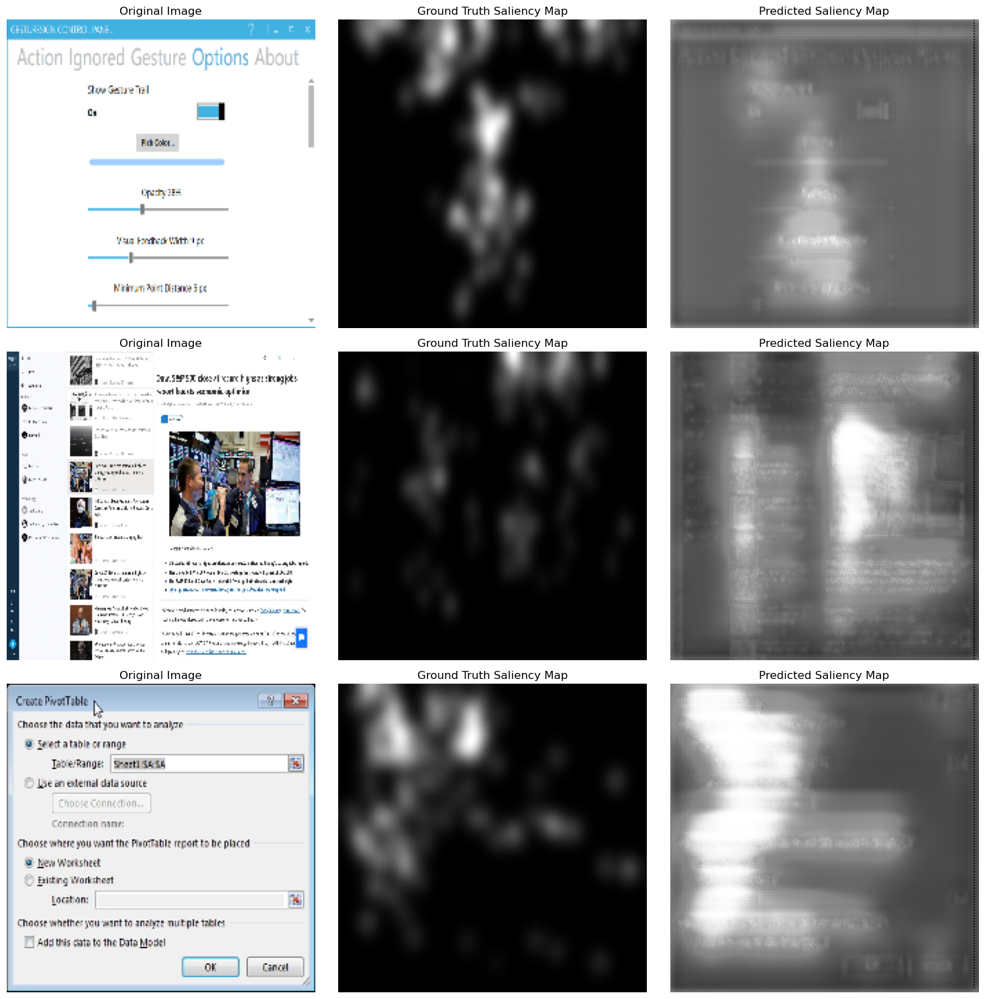

In [47]:
visualize_results(UMSI_batch_norm_, test_data_gen, num_samples=3) # 3 random examples

remove batch normalization layers after pooling layers, add them after bottleneck layer
**specified weight initializations to try to address vanishing gradients** and **added weight regularizers and dropout layers to prevent overfitting** (training for a few more epochs bc added regularizations)

In [ ]:
# Define the UMSI++ model
def UMSI_batch_norm_regularized(input_shape=(224, 224, 3)):
    # Input layer
    inputs = Input(shape=input_shape)
    
    # --------------------------
    # Encoder (Feature Extraction)
    # --------------------------
    # Block 1
    x1 = Conv2D(32, (3, 3), activation='relu', padding='same', name='block1_conv1', kernel_initializer='he_normal', kernel_regularizer=tf.keras.regularizers.l2(0.001))(inputs)
    x1 = BatchNormalization(name="block1_conv1_BN")(x1) # added
    x1 = Conv2D(32, (3, 3), activation='relu', padding='same', name='block1_conv2', kernel_initializer='he_normal', kernel_regularizer=tf.keras.regularizers.l2(0.001))(x1)
    x1 = BatchNormalization(name="block1_conv2_BN")(x1) # added
    p1 = MaxPooling2D((2, 2), name='block1_pool')(x1)
    
    # Block 2
    x2 = Conv2D(64, (3, 3), activation='relu', padding='same', name='block2_conv1', kernel_initializer='he_normal', kernel_regularizer=tf.keras.regularizers.l2(0.001))(p1)
    x2 = BatchNormalization(name="block2_conv1_BN")(x2) # added
    x2 = Conv2D(64, (3, 3), activation='relu', padding='same', name='block2_conv2', kernel_initializer='he_normal', kernel_regularizer=tf.keras.regularizers.l2(0.001))(x2)
    x2 = BatchNormalization(name="block2_conv2_BN")(x2) # added
    p2 = MaxPooling2D((2, 2), name='block2_pool')(x2)
    
    # Block 3
    x3 = Conv2D(128, (3, 3), activation='relu', padding='same', name='block3_conv1', kernel_initializer='he_normal', kernel_regularizer=tf.keras.regularizers.l2(0.001))(p2)
    x3 = BatchNormalization(name="block3_conv1_BN")(x3) # added
    x3 = Conv2D(128, (3, 3), activation='relu', padding='same', name='block3_conv2', kernel_initializer='he_normal', kernel_regularizer=tf.keras.regularizers.l2(0.001))(x3)
    x3 = BatchNormalization(name="block3_conv2_BN")(x3) # added
    p3 = MaxPooling2D((2, 2), name='block3_pool')(x3)
    
    # --------------------------
    # Bottleneck (Multi-Scale Feature Aggregation)
    # --------------------------
    bottleneck = Conv2D(256, (3, 3), activation='relu', padding='same', name='bottleneck_conv1', kernel_initializer='he_normal', kernel_regularizer=tf.keras.regularizers.l2(0.001))(p3)
    bottleneck = BatchNormalization(name="bottleneck_conv1_BN")(bottleneck) # added
    bottleneck = Conv2D(256, (3, 3), activation='relu', padding='same', name='bottleneck_conv2', kernel_initializer='he_normal', kernel_regularizer=tf.keras.regularizers.l2(0.001))(bottleneck)
    
    # --------------------------
    # Decoder (Saliency Map Reconstruction)
    # --------------------------
    # Block 4
    u4 = BatchNormalization(name="bottleneck_conv2_BN")(bottleneck) # added
    u4 = Conv2DTranspose(128, (3, 3), strides=(2, 2), padding='same', name='block4_deconv')(u4)
    u4 = concatenate([u4, x3], name='block4_concat')
    u4 = BatchNormalization(name="block4_concat_BN")(u4) # added
    u4 = Dropout(0.3)(u4)
    u4 = Conv2D(128, (3, 3), activation='relu', padding='same', name='block4_conv1', kernel_initializer='he_normal', kernel_regularizer=tf.keras.regularizers.l2(0.001))(u4)
    u4 = Conv2D(128, (3, 3), activation='relu', padding='same', name='block4_conv2', kernel_initializer='he_normal', kernel_regularizer=tf.keras.regularizers.l2(0.001))(u4)
    
    # Block 5
    u5 = BatchNormalization(name="block4_conv2_BN")(u4) # added
    u5 = Conv2DTranspose(64, (3, 3), strides=(2, 2), padding='same', name='block5_deconv')(u5)
    u5 = concatenate([u5, x2], name='block5_concat')
    u5 = BatchNormalization(name="block5_concat_BN")(u5) # added
    u5 = Dropout(0.3)(u5)
    u5 = Conv2D(64, (3, 3), activation='relu', padding='same', name='block5_conv1', kernel_initializer='he_normal', kernel_regularizer=tf.keras.regularizers.l2(0.001))(u5)
    u5 = Conv2D(64, (3, 3), activation='relu', padding='same', name='block5_conv2', kernel_initializer='he_normal', kernel_regularizer=tf.keras.regularizers.l2(0.001))(u5)
    
    # Block 6
    u6 = BatchNormalization(name="block5_conv2_BN")(u5) # added
    u6 = Conv2DTranspose(32, (3, 3), strides=(2, 2), padding='same', name='block6_deconv')(u6)
    u6 = concatenate([u6, x1], name='block6_concat')
    u6 = BatchNormalization(name="block6_concat_BN")(u6) # added
    u6 = Dropout(0.3)(u6)
    u6 = Conv2D(32, (3, 3), activation='relu', padding='same', name='block6_conv1', kernel_initializer='he_normal', kernel_regularizer=tf.keras.regularizers.l2(0.001))(u6)
    u6 = Conv2D(32, (3, 3), activation='relu', padding='same', name='block6_conv2', kernel_initializer='he_normal', kernel_regularizer=tf.keras.regularizers.l2(0.001))(u6)
    u6 = Dropout(0.3)(u6)
    
    # --------------------------
    # Saliency Output
    # --------------------------
    saliency_output = Conv2D(1, (1, 1), activation='sigmoid', name='saliency_output', kernel_initializer='he_normal', kernel_regularizer=tf.keras.regularizers.l2(0.001))(u6)
    
    # --------------------------
    # Define the Model
    # --------------------------
    model = Model(inputs, saliency_output, name='UMSI_neg_bias')  # Use a valid model name
    
    return model

Epoch 1/15


2025-03-10 12:10:42.228744: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


50/50 [==============================] - ETA: 0s - loss: 1.5611 - similarity: 0.3355

2025-03-10 12:10:48.558073: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


50/50 [==============================] - 10s 109ms/step - loss: 1.5611 - similarity: 0.3355 - val_loss: 0.7094 - val_similarity: 0.1574
Epoch 2/15
50/50 [==============================] - 5s 93ms/step - loss: 0.4576 - similarity: 0.4058 - val_loss: 0.3270 - val_similarity: 0.2758
Epoch 3/15
50/50 [==============================] - 5s 97ms/step - loss: 0.2590 - similarity: 0.4061 - val_loss: 0.2319 - val_similarity: 0.3202
Epoch 4/15
50/50 [==============================] - 4s 86ms/step - loss: 0.1907 - similarity: 0.4687 - val_loss: 0.1916 - val_similarity: 0.0841
Epoch 5/15
50/50 [==============================] - 4s 86ms/step - loss: 0.1600 - similarity: 0.4713 - val_loss: 0.1687 - val_similarity: 0.1130
Epoch 6/15
50/50 [==============================] - 4s 90ms/step - loss: 0.1411 - similarity: 0.5054 - val_loss: 0.1533 - val_similarity: 0.0719
Epoch 7/15
50/50 [==============================] - 4s 89ms/step - loss: 0.1279 - similarity: 0.4837 - val_loss: 0.1425 - val_similarity: 0

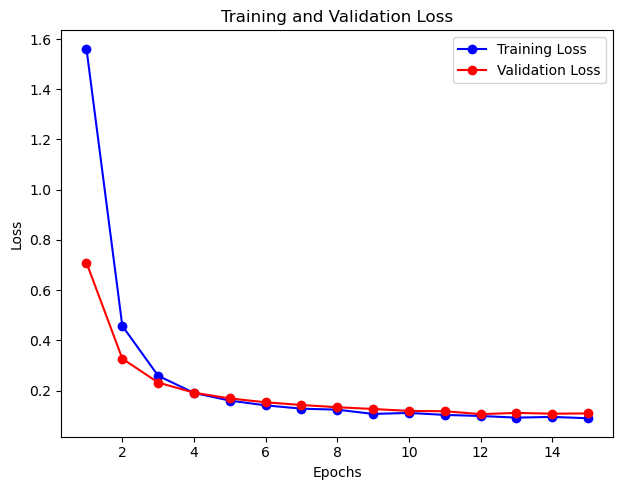

2025-03-10 12:11:53.474505: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


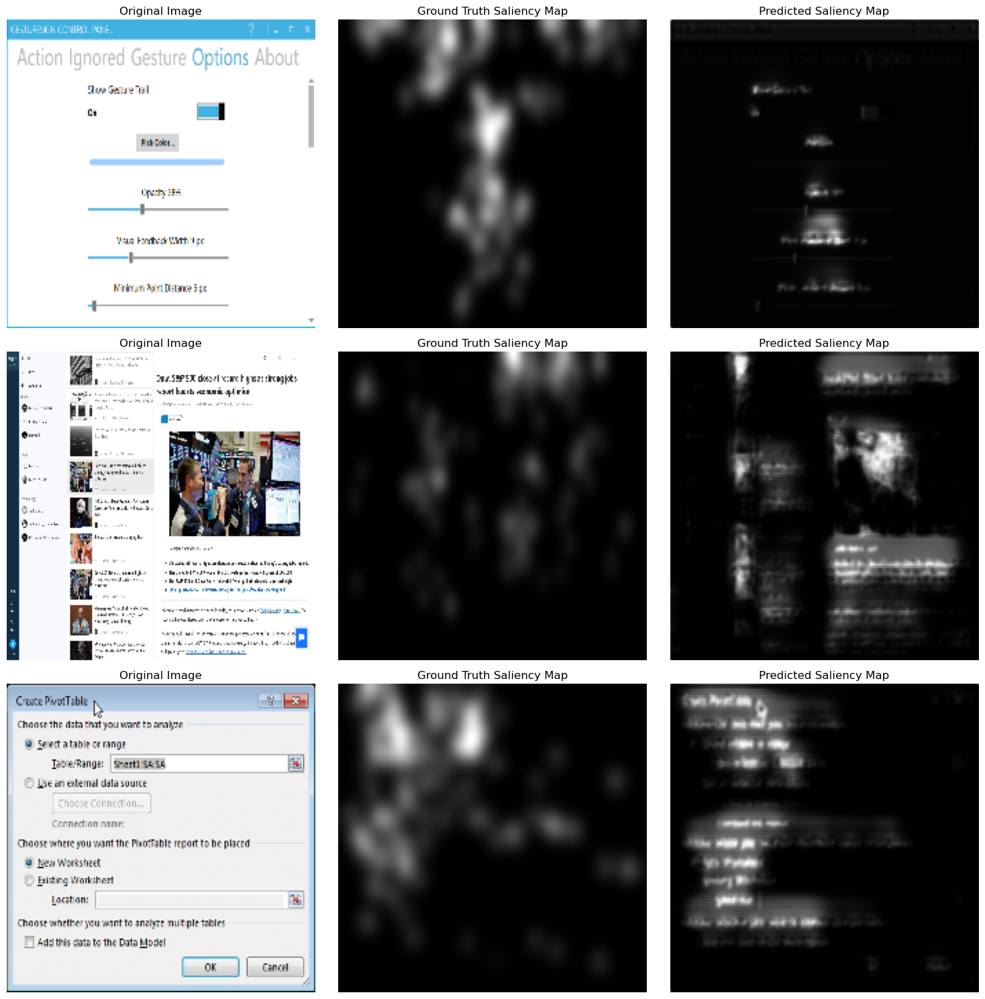

In [ ]:
opt = Adam(learning_rate=0.001)

# Train the model using the same combined loss as the one in UEyes.ipynb, just with a smaller set of training data and less epochs
UMSI_batch_norm_ = UMSI_batch_norm_regularized(input_shape=(224, 224, 3))
UMSI_batch_norm_.compile(optimizer=opt, loss = 'mae', metrics=[similarity])
history = UMSI_batch_norm_.fit(train_data_gen, validation_data=valid_data_gen, epochs=15, steps_per_epoch=len(train_data_gen)) # Train the model and capture the history
plot_learning_curve(history)
visualize_results(UMSI_batch_norm_, test_data_gen, num_samples=3) # 3 random examples

take out some of batch normalization layers (which might be adding noise)

In [ ]:
# Define the UMSI++ model
def UMSI_batch_norm_regularized_(input_shape=(224, 224, 3)):
    # Input layer
    inputs = Input(shape=input_shape)
    
    # --------------------------
    # Encoder (Feature Extraction)
    # --------------------------
    # Block 1
    x1 = Conv2D(32, (3, 3), activation='relu', padding='same', name='block1_conv1', kernel_initializer='he_normal', kernel_regularizer=tf.keras.regularizers.l2(0.001))(inputs)
    x1 = Conv2D(32, (3, 3), activation='relu', padding='same', name='block1_conv2', kernel_initializer='he_normal', kernel_regularizer=tf.keras.regularizers.l2(0.001))(x1)
    x1 = BatchNormalization(name="block1_conv2_BN")(x1) # added
    p1 = MaxPooling2D((2, 2), name='block1_pool')(x1)
    
    # Block 2
    x2 = Conv2D(64, (3, 3), activation='relu', padding='same', name='block2_conv1', kernel_initializer='he_normal', kernel_regularizer=tf.keras.regularizers.l2(0.001))(p1)
    x2 = Conv2D(64, (3, 3), activation='relu', padding='same', name='block2_conv2', kernel_initializer='he_normal', kernel_regularizer=tf.keras.regularizers.l2(0.001))(x2)
    x2 = BatchNormalization(name="block2_conv2_BN")(x2) # added
    p2 = MaxPooling2D((2, 2), name='block2_pool')(x2)
    
    # Block 3
    x3 = Conv2D(128, (3, 3), activation='relu', padding='same', name='block3_conv1', kernel_initializer='he_normal', kernel_regularizer=tf.keras.regularizers.l2(0.001))(p2)
    x3 = Conv2D(128, (3, 3), activation='relu', padding='same', name='block3_conv2', kernel_initializer='he_normal', kernel_regularizer=tf.keras.regularizers.l2(0.001))(x3)
    x3 = BatchNormalization(name="block3_conv2_BN")(x3) # added
    p3 = MaxPooling2D((2, 2), name='block3_pool')(x3)
    
    # --------------------------
    # Bottleneck (Multi-Scale Feature Aggregation)
    # --------------------------
    bottleneck = Conv2D(256, (3, 3), activation='relu', padding='same', name='bottleneck_conv1', kernel_initializer='he_normal', kernel_regularizer=tf.keras.regularizers.l2(0.001))(p3)
    bottleneck = Conv2D(256, (3, 3), activation='relu', padding='same', name='bottleneck_conv2', kernel_initializer='he_normal', kernel_regularizer=tf.keras.regularizers.l2(0.001))(bottleneck)
    bottleneck = BatchNormalization(name="bottleneck_conv2_BN")(bottleneck) # added
    
    # --------------------------
    # Decoder (Saliency Map Reconstruction)
    # --------------------------
    # Block 4
    u4 = Conv2DTranspose(128, (3, 3), strides=(2, 2), padding='same', name='block4_deconv')(bottleneck)
    u4 = concatenate([u4, x3], name='block4_concat')
    u4 = Dropout(0.3)(u4)
    u4 = Conv2D(128, (3, 3), activation='relu', padding='same', name='block4_conv1', kernel_initializer='he_normal', kernel_regularizer=tf.keras.regularizers.l2(0.001))(u4)
    u4 = Conv2D(128, (3, 3), activation='relu', padding='same', name='block4_conv2', kernel_initializer='he_normal', kernel_regularizer=tf.keras.regularizers.l2(0.001))(u4)
    u4 = BatchNormalization(name="block4_conv2_BN")(u4) # added
    
    # Block 5
    u5 = Conv2DTranspose(64, (3, 3), strides=(2, 2), padding='same', name='block5_deconv')(u4)
    u5 = concatenate([u5, x2], name='block5_concat')
    u5 = Dropout(0.3)(u5)
    u5 = Conv2D(64, (3, 3), activation='relu', padding='same', name='block5_conv1', kernel_initializer='he_normal', kernel_regularizer=tf.keras.regularizers.l2(0.001))(u5)
    u5 = Conv2D(64, (3, 3), activation='relu', padding='same', name='block5_conv2', kernel_initializer='he_normal', kernel_regularizer=tf.keras.regularizers.l2(0.001))(u5)
    u5 = BatchNormalization(name="block5_conv2_BN")(u5) # added
    
    # Block 6
    u6 = Conv2DTranspose(32, (3, 3), strides=(2, 2), padding='same', name='block6_deconv')(u5)
    u6 = concatenate([u6, x1], name='block6_concat')
    u6 = Dropout(0.3)(u6)
    u6 = Conv2D(32, (3, 3), activation='relu', padding='same', name='block6_conv1', kernel_initializer='he_normal', kernel_regularizer=tf.keras.regularizers.l2(0.001))(u6)
    u6 = Conv2D(32, (3, 3), activation='relu', padding='same', name='block6_conv2', kernel_initializer='he_normal', kernel_regularizer=tf.keras.regularizers.l2(0.001))(u6)
    u6 = Dropout(0.3)(u6)
    
    # --------------------------
    # Saliency Output
    # --------------------------
    saliency_output = Conv2D(1, (1, 1), activation='sigmoid', name='saliency_output', kernel_initializer='he_normal', kernel_regularizer=tf.keras.regularizers.l2(0.001))(u6)
    
    # --------------------------
    # Define the Model
    # --------------------------
    model = Model(inputs, saliency_output, name='UMSI_neg_bias')  # Use a valid model name
    
    return model

Epoch 1/15


2025-03-10 12:12:07.205256: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


50/50 [==============================] - ETA: 0s - loss: 1.4868 - similarity: 0.2531

2025-03-10 12:12:13.382987: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


50/50 [==============================] - 8s 104ms/step - loss: 1.4868 - similarity: 0.2531 - val_loss: 0.6576 - val_similarity: 0.3274
Epoch 2/15
50/50 [==============================] - 4s 79ms/step - loss: 0.4260 - similarity: 0.3671 - val_loss: 0.3057 - val_similarity: 0.2174
Epoch 3/15
50/50 [==============================] - 4s 84ms/step - loss: 0.2354 - similarity: 0.4133 - val_loss: 0.2100 - val_similarity: 0.3277
Epoch 4/15
50/50 [==============================] - 4s 82ms/step - loss: 0.1833 - similarity: 0.4274 - val_loss: 0.1783 - val_similarity: 0.1290
Epoch 5/15
50/50 [==============================] - 4s 80ms/step - loss: 0.1476 - similarity: 0.4522 - val_loss: 0.1535 - val_similarity: 0.3969
Epoch 6/15
50/50 [==============================] - 4s 80ms/step - loss: 0.1356 - similarity: 0.4313 - val_loss: 0.1452 - val_similarity: 0.3228
Epoch 7/15
50/50 [==============================] - 4s 80ms/step - loss: 0.1191 - similarity: 0.5024 - val_loss: 0.1323 - val_similarity: 0.

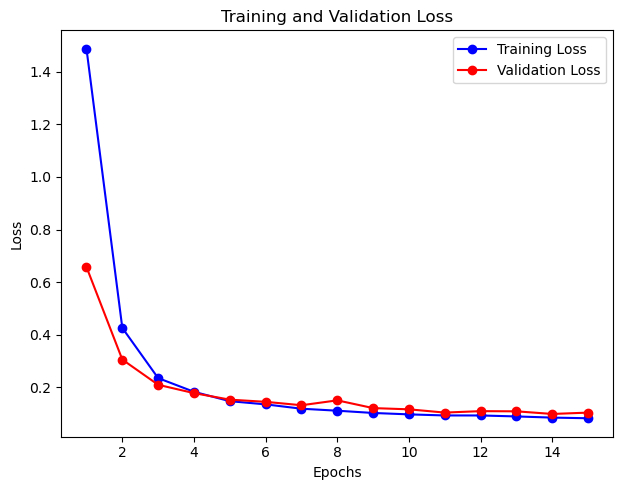

2025-03-10 12:13:12.157700: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


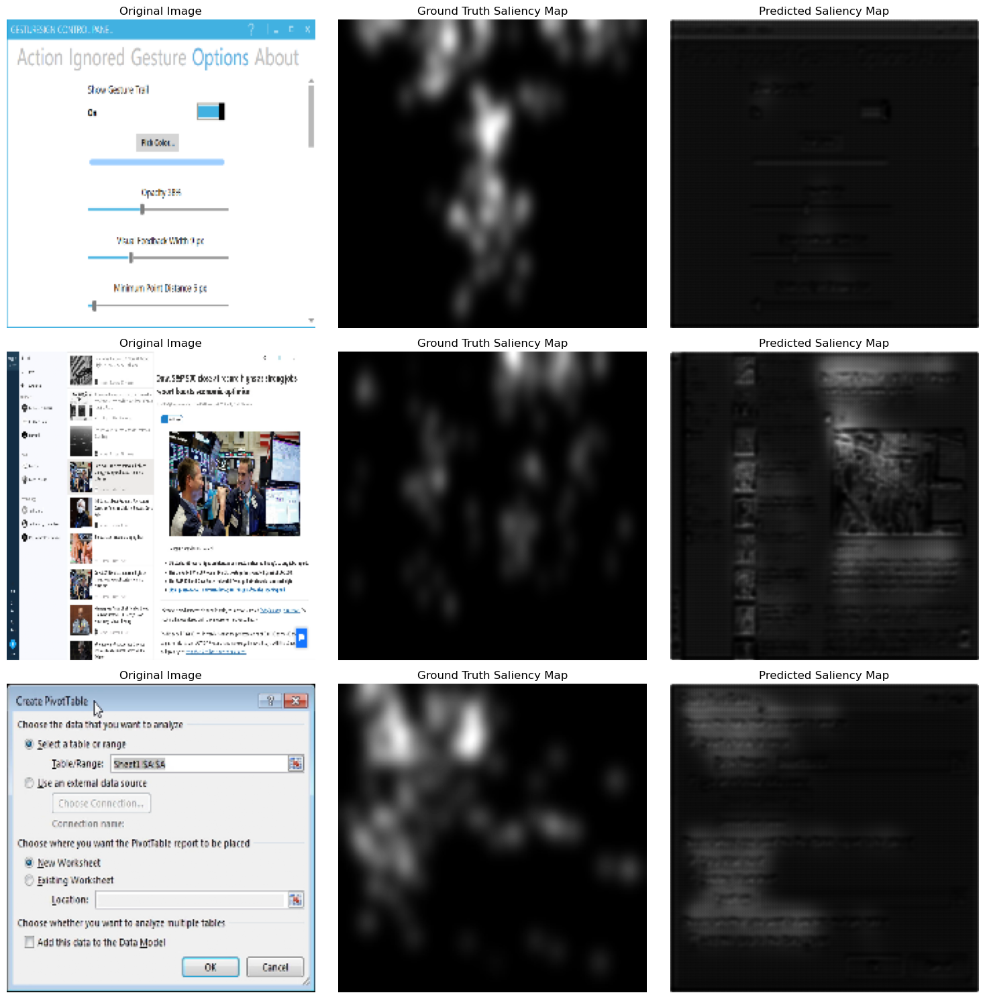

In [ ]:
opt = Adam(learning_rate=0.001)

# Train the model using the same combined loss as the one in UEyes.ipynb, just with a smaller set of training data and less epochs
UMSI_batch_norm_ = UMSI_batch_norm_regularized_(input_shape=(224, 224, 3))
UMSI_batch_norm_.compile(optimizer=opt, loss = 'mae', metrics=[similarity])
history = UMSI_batch_norm_.fit(train_data_gen, validation_data=valid_data_gen, epochs=15, steps_per_epoch=len(train_data_gen)) # Train the model and capture the history
plot_learning_curve(history)
visualize_results(UMSI_batch_norm_, test_data_gen, num_samples=3) # 3 random examples

Epoch 1/10


2025-03-10 12:17:39.403971: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


50/50 [==============================] - ETA: 0s - loss: -0.7974 - similarity: 0.4150

2025-03-10 12:17:49.836080: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


50/50 [==============================] - 14s 172ms/step - loss: -0.7974 - similarity: 0.4150 - val_loss: 7.7543 - val_similarity: 0.2651
Epoch 2/10
50/50 [==============================] - 6s 127ms/step - loss: -1.0095 - similarity: 0.4160 - val_loss: -0.6688 - val_similarity: 0.4209
Epoch 3/10
50/50 [==============================] - 6s 125ms/step - loss: -1.0579 - similarity: 0.4181 - val_loss: -1.0352 - val_similarity: 0.4326
Epoch 4/10
50/50 [==============================] - 6s 114ms/step - loss: -1.1621 - similarity: 0.4201 - val_loss: -0.7489 - val_similarity: 0.4208
Epoch 5/10
50/50 [==============================] - 6s 112ms/step - loss: -0.8364 - similarity: 0.4003 - val_loss: -0.9095 - val_similarity: 0.4216
Epoch 6/10
50/50 [==============================] - 6s 114ms/step - loss: -0.8685 - similarity: 0.3984 - val_loss: -1.0138 - val_similarity: 0.4224
Epoch 7/10
50/50 [==============================] - 7s 130ms/step - loss: -0.9591 - similarity: 0.4001 - val_loss: -0.9489 

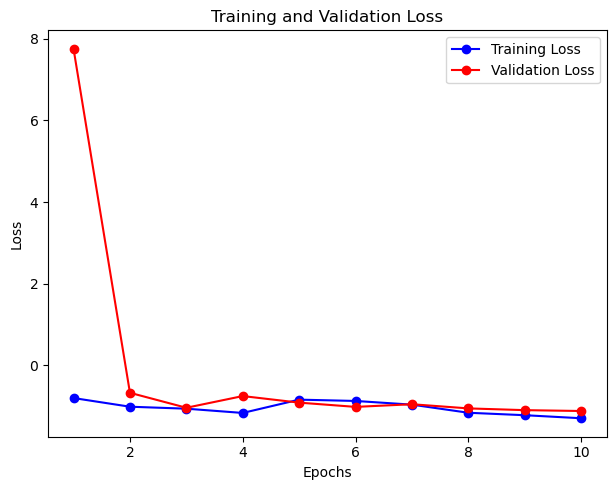

2025-03-10 12:18:45.702174: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


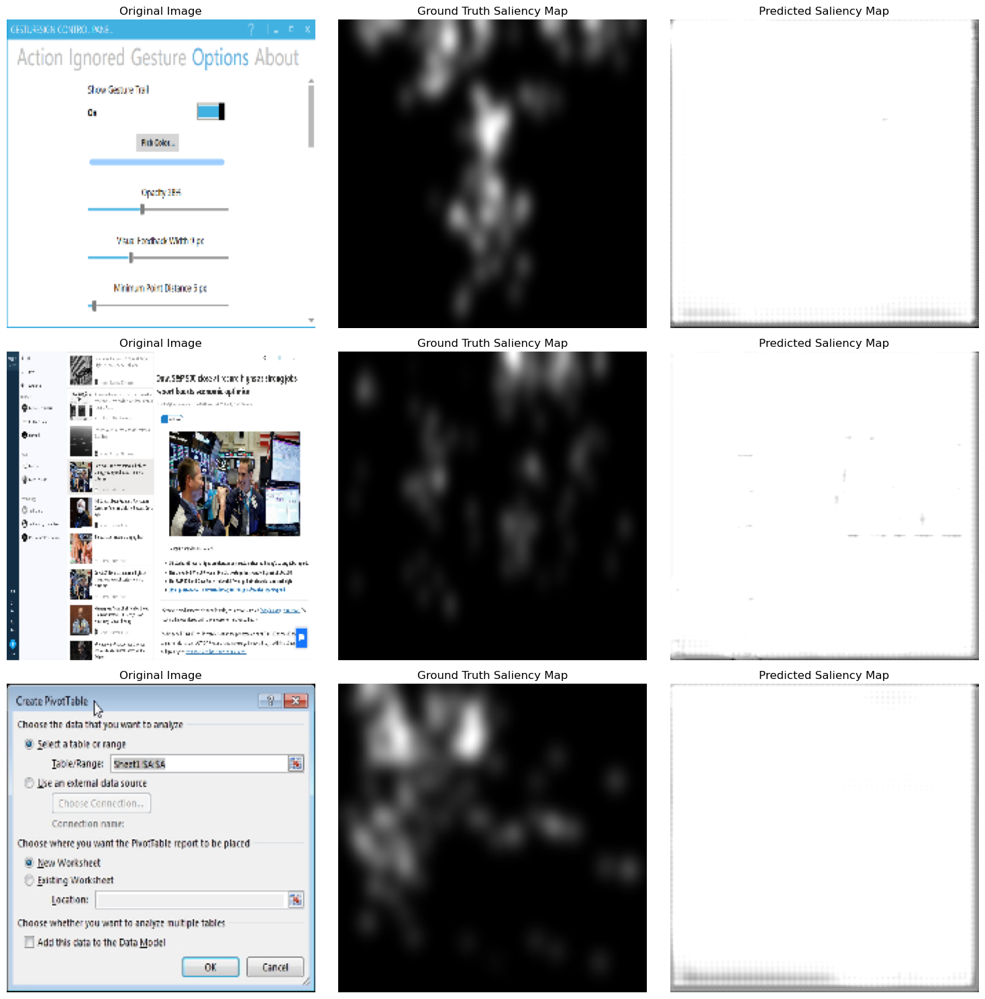

In [25]:
UMSI_batch_norm_.compile(optimizer=opt, loss = combined_loss_UEyes_2, metrics=[similarity])
history = UMSI_batch_norm_.fit(train_data_gen, validation_data=valid_data_gen, epochs=10, steps_per_epoch=len(train_data_gen)) # Train the model and capture the history
plot_learning_curve(history)
visualize_results(UMSI_batch_norm_, test_data_gen, num_samples=3) # 3 random examples

padding='same' and use_bias=False ?

### use optimizer with tapering learning rate scheduler

In [ ]:
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=0.001,
    decay_steps=10000,
    decay_rate=0.9)
opt = Adam(learning_rate=lr_schedule)

# Final Model Architecture

- batch normalization layers
- regularization: l2 penalty and dropout layers 

In [ ]:
u5 = Dropout(0.2)(u5)

In [23]:
# Define the UMSI++ model
def UMSI(input_shape=(224, 224, 3)):
    # Input layer
    inputs = Input(shape=input_shape)
    
    # --------------------------
    # Encoder (Feature Extraction)
    # --------------------------
    # Block 1
    x1 = Conv2D(32, (3, 3), activation='relu', padding='same', name='block1_conv1')(inputs)
    x1 = BatchNormalization(name="block1_conv1_BN")(x1) # added
    x1 = Conv2D(32, (3, 3), activation='relu', padding='same', name='block1_conv2')(x1)
    x1 = BatchNormalization(name="block1_conv2_BN")(x1) # added
    p1 = MaxPooling2D((2, 2), name='block1_pool')(x1)
    
    # Block 2
    p1 = BatchNormalization(name="block1_pool_BN")(p1) # added
    x2 = Conv2D(64, (3, 3), activation='relu', padding='same', name='block2_conv1')(p1)
    x2 = BatchNormalization(name="block2_conv1_BN")(x2) # added
    x2 = Conv2D(64, (3, 3), activation='relu', padding='same', name='block2_conv2')(x2)
    x2 = BatchNormalization(name="block2_conv2_BN")(x2) # added
    p2 = MaxPooling2D((2, 2), name='block2_pool')(x2)
    
    # Block 3
    p2 = BatchNormalization(name="block2_pool_BN")(p2) # added
    x3 = Conv2D(128, (3, 3), activation='relu', padding='same', name='block3_conv1')(p2)
    x3 = BatchNormalization(name="block3_conv1_BN")(x3) # added
    x3 = Conv2D(128, (3, 3), activation='relu', padding='same', name='block3_conv2')(x3)
    x3 = BatchNormalization(name="block3_conv2_BN")(x3) # added
    p3 = MaxPooling2D((2, 2), name='block3_pool')(x3)
    
    # --------------------------
    # Bottleneck (Multi-Scale Feature Aggregation)
    # --------------------------
    p3 = BatchNormalization(name="block3_pool_BN")(p3) # added
    bottleneck = Conv2D(256, (3, 3), activation='relu', padding='same', name='bottleneck_conv1')(p3)
    bottleneck = Conv2D(256, (3, 3), activation='relu', padding='same', name='bottleneck_conv2')(bottleneck)
    
    # --------------------------
    # Decoder (Saliency Map Reconstruction)
    # --------------------------
    # Block 4
    u4 = BatchNormalization(name="bottleneck_conv2_BN")(bottleneck) # added
    u4 = Conv2DTranspose(128, (3, 3), strides=(2, 2), padding='same', name='block4_deconv')(u4)
    u4 = concatenate([u4, x3], name='block4_concat')
    u4 = BatchNormalization(name="block4_concat_BN")(u4) # added
    u4 = Dropout(0.3)(u4)
    u4 = Conv2D(128, (3, 3), activation='relu', padding='same', name='block4_conv1', kernel_initializer='he_normal', kernel_regularizer=tf.keras.regularizers.l2(0.001))(u4)
    u4 = Conv2D(128, (3, 3), activation='relu', padding='same', name='block4_conv2', kernel_initializer='he_normal', kernel_regularizer=tf.keras.regularizers.l2(0.001))(u4)
    
    # Block 5
    u5 = BatchNormalization(name="block4_conv2_BN")(u4) # added
    u5 = Conv2DTranspose(64, (3, 3), strides=(2, 2), padding='same', name='block5_deconv')(u5)
    u5 = concatenate([u5, x2], name='block5_concat')
    u5 = BatchNormalization(name="block5_concat_BN")(u5) # added
    u5 = Dropout(0.3)(u5)
    u5 = Conv2D(64, (3, 3), activation='relu', padding='same', name='block5_conv1', kernel_initializer='he_normal', kernel_regularizer=tf.keras.regularizers.l2(0.001))(u5)
    u5 = Conv2D(64, (3, 3), activation='relu', padding='same', name='block5_conv2', kernel_initializer='he_normal', kernel_regularizer=tf.keras.regularizers.l2(0.001))(u5)
    
    # Block 6
    u6 = BatchNormalization(name="block5_conv2_BN")(u5) # added
    u6 = Conv2DTranspose(32, (3, 3), strides=(2, 2), padding='same', name='block6_deconv')(u6)
    u6 = concatenate([u6, x1], name='block6_concat')
    u6 = BatchNormalization(name="block6_concat_BN")(u6) # added
    u6 = Dropout(0.3)(u6)
    u6 = Conv2D(32, (3, 3), activation='relu', padding='same', name='block6_conv1', kernel_initializer='he_normal', kernel_regularizer=tf.keras.regularizers.l2(0.001))(u6)
    u6 = Conv2D(32, (3, 3), activation='relu', padding='same', name='block6_conv2', kernel_initializer='he_normal', kernel_regularizer=tf.keras.regularizers.l2(0.001))(u6)
    
    # --------------------------
    # Saliency Output
    # --------------------------
    saliency_output = Conv2D(1, (1, 1), activation='sigmoid', name='saliency_output')(u6)
    
    # --------------------------
    # Define the Model
    # --------------------------
    model = Model(inputs, saliency_output, name='UMSI_neg_bias')  # Use a valid model name
    
    return model

Epoch 1/15


2025-03-10 12:36:39.443049: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


50/50 [==============================] - ETA: 0s - loss: 0.5892 - similarity: 0.3410

2025-03-10 12:36:45.818796: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


50/50 [==============================] - 8s 102ms/step - loss: 0.5892 - similarity: 0.3410 - val_loss: 0.3122 - val_similarity: 0.2295
Epoch 2/15
50/50 [==============================] - 4s 86ms/step - loss: 0.2185 - similarity: 0.4305 - val_loss: 0.1861 - val_similarity: 0.3020
Epoch 3/15
50/50 [==============================] - 4s 83ms/step - loss: 0.1483 - similarity: 0.4876 - val_loss: 0.1528 - val_similarity: 0.3576
Epoch 4/15
50/50 [==============================] - 4s 86ms/step - loss: 0.1230 - similarity: 0.5285 - val_loss: 0.1392 - val_similarity: 0.3845
Epoch 5/15
50/50 [==============================] - 4s 85ms/step - loss: 0.1088 - similarity: 0.5466 - val_loss: 0.1277 - val_similarity: 0.0202
Epoch 6/15
50/50 [==============================] - 4s 84ms/step - loss: 0.0993 - similarity: 0.5625 - val_loss: 0.1207 - val_similarity: 0.1747
Epoch 7/15
50/50 [==============================] - 4s 83ms/step - loss: 0.0892 - similarity: 0.5882 - val_loss: 0.1128 - val_similarity: 0.

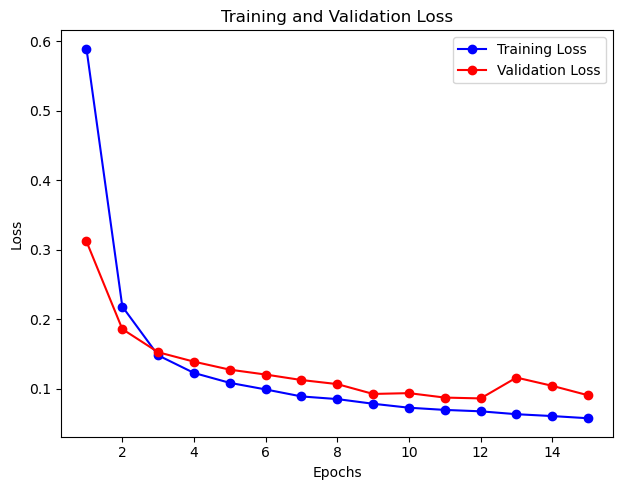

2025-03-10 12:37:46.171792: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


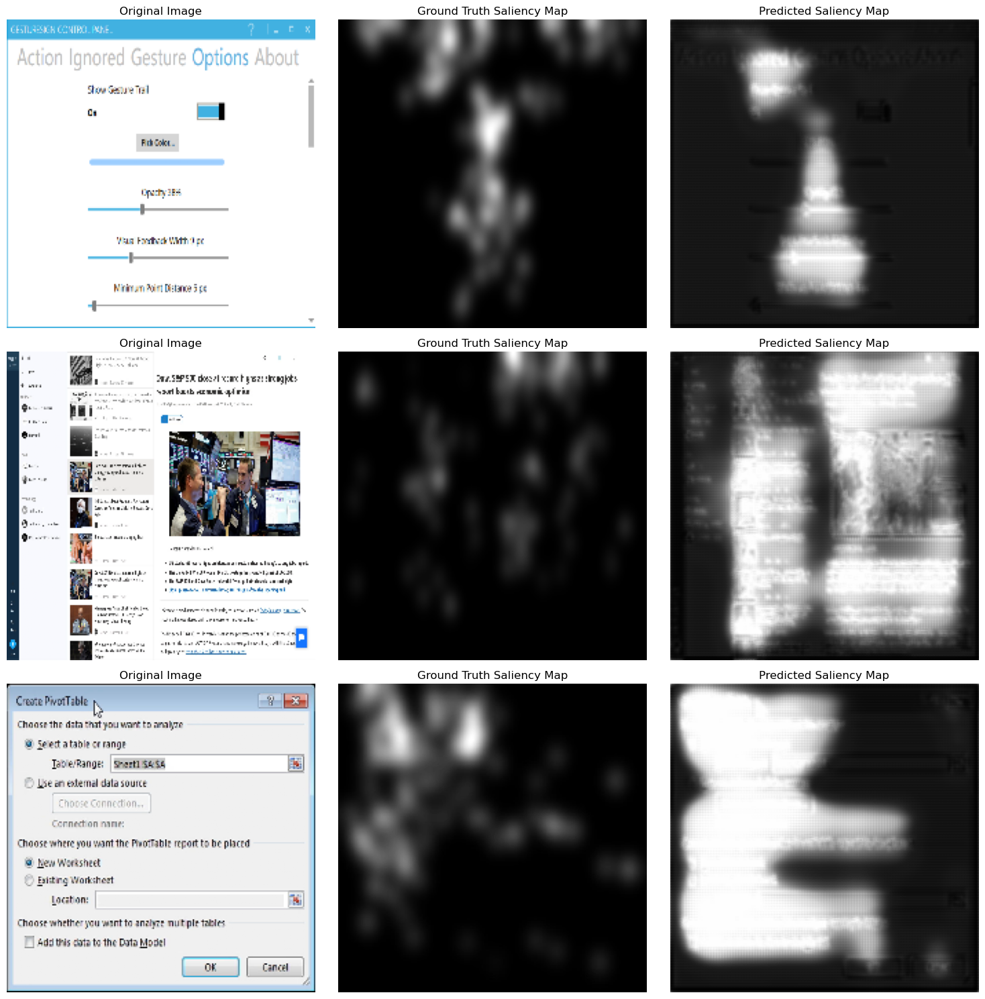

In [30]:
opt = Adam(learning_rate=0.001)

# Train the model using the same combined loss as the one in UEyes.ipynb, just with a smaller set of training data and less epochs
UMSI_1 = UMSI(input_shape=(224, 224, 3))
UMSI_1.compile(optimizer=opt, loss = 'mae', metrics=[similarity])
history = UMSI_1.fit(train_data_gen, validation_data=valid_data_gen, epochs=15, steps_per_epoch=len(train_data_gen)) # Train the model and capture the history
plot_learning_curve(history)
visualize_results(UMSI_1, test_data_gen, num_samples=3) # 3 random examples

Epoch 1/10


2025-03-10 12:42:34.814621: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


50/50 [==============================] - ETA: 0s - loss: -4.7945 - similarity: 0.6140

2025-03-10 12:42:52.160913: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


50/50 [==============================] - 22s 270ms/step - loss: -4.7945 - similarity: 0.6140 - val_loss: -3.4056 - val_similarity: 0.5271
Epoch 2/10
50/50 [==============================] - 9s 180ms/step - loss: -5.0856 - similarity: 0.5674 - val_loss: -3.3979 - val_similarity: 0.5193
Epoch 3/10
50/50 [==============================] - 8s 162ms/step - loss: -5.1902 - similarity: 0.5711 - val_loss: -3.3255 - val_similarity: 0.5120
Epoch 4/10
50/50 [==============================] - 7s 144ms/step - loss: -5.2575 - similarity: 0.5134 - val_loss: -3.2926 - val_similarity: 0.4968
Epoch 5/10
50/50 [==============================] - 8s 158ms/step - loss: -5.3024 - similarity: 0.4659 - val_loss: -3.5630 - val_similarity: 0.5204
Epoch 6/10
50/50 [==============================] - 8s 151ms/step - loss: -5.3100 - similarity: 0.4669 - val_loss: -2.7277 - val_similarity: 0.4849
Epoch 7/10
50/50 [==============================] - 8s 153ms/step - loss: -5.2562 - similarity: 0.4828 - val_loss: -3.3470

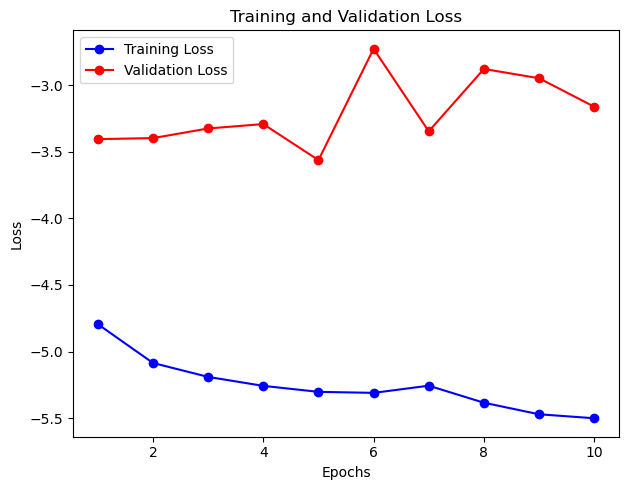

2025-03-10 12:44:05.750396: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


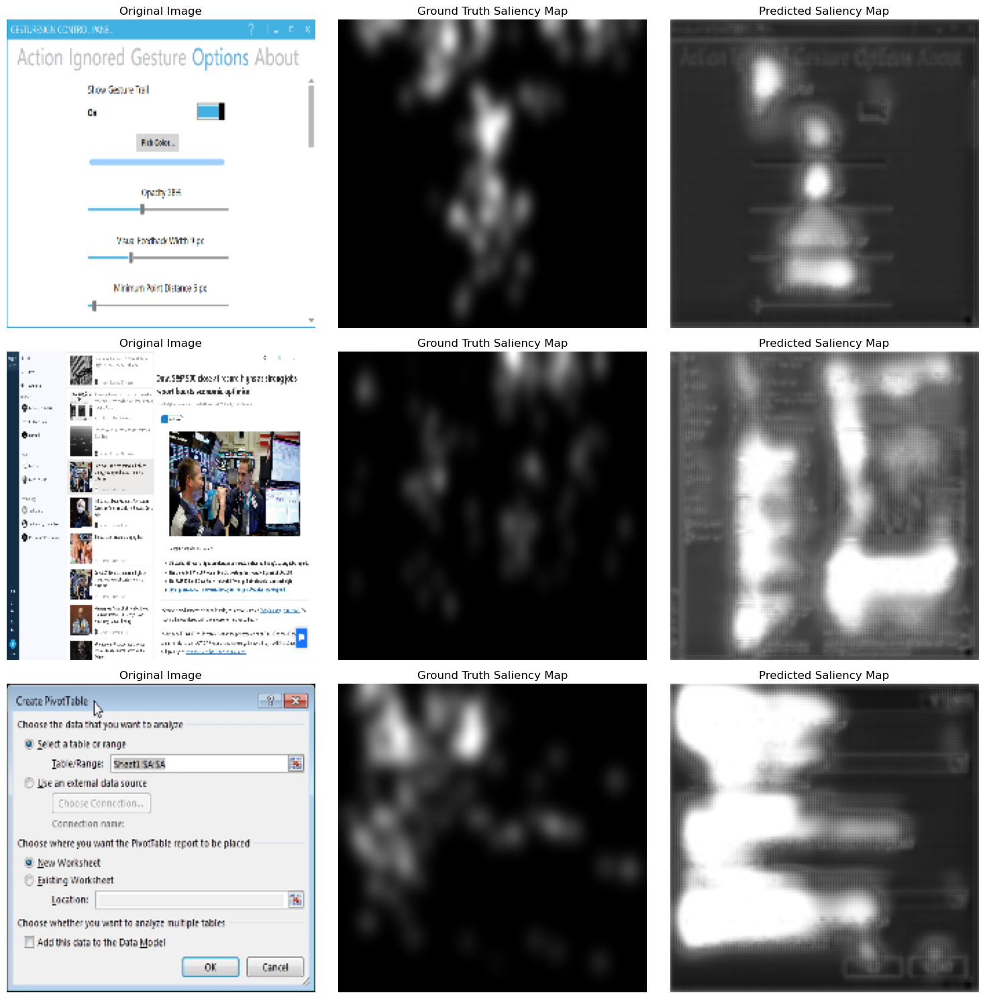

In [32]:
opt = Adam(learning_rate=0.0005)
UMSI_1.compile(optimizer=opt, loss = combined_loss, metrics=[similarity])
history = UMSI_1.fit(train_data_gen, validation_data=valid_data_gen, epochs=10, steps_per_epoch=len(train_data_gen)) # Train the model and capture the history
plot_learning_curve(history)
visualize_results(UMSI_1, test_data_gen, num_samples=3) # 3 random examples

Epoch 1/15


2025-03-10 13:19:14.725313: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


50/50 [==============================] - ETA: 0s - loss: -15.3227 - similarity: 0.4936

2025-03-10 13:19:22.459471: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


50/50 [==============================] - 10s 121ms/step - loss: -15.3227 - similarity: 0.4936 - val_loss: -6.3562 - val_similarity: 0.3415
Epoch 2/15
50/50 [==============================] - 5s 92ms/step - loss: -16.9526 - similarity: 0.5105 - val_loss: -7.6707 - val_similarity: 0.4050
Epoch 3/15
50/50 [==============================] - 5s 94ms/step - loss: -17.7612 - similarity: 0.4991 - val_loss: -7.4010 - val_similarity: 0.4100
Epoch 4/15
50/50 [==============================] - 5s 95ms/step - loss: -17.9111 - similarity: 0.4875 - val_loss: -7.6867 - val_similarity: 0.4118
Epoch 5/15
50/50 [==============================] - 5s 90ms/step - loss: -18.5610 - similarity: 0.4788 - val_loss: -7.7240 - val_similarity: 0.4193
Epoch 6/15
50/50 [==============================] - 5s 93ms/step - loss: -18.9149 - similarity: 0.4671 - val_loss: -11.5729 - val_similarity: 0.4242
Epoch 7/15
50/50 [==============================] - 5s 91ms/step - loss: -19.3715 - similarity: 0.4648 - val_loss: -12.7

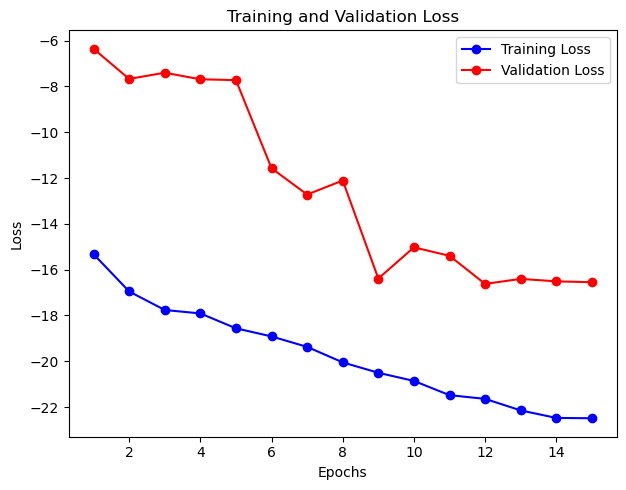

2025-03-10 13:20:29.106581: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


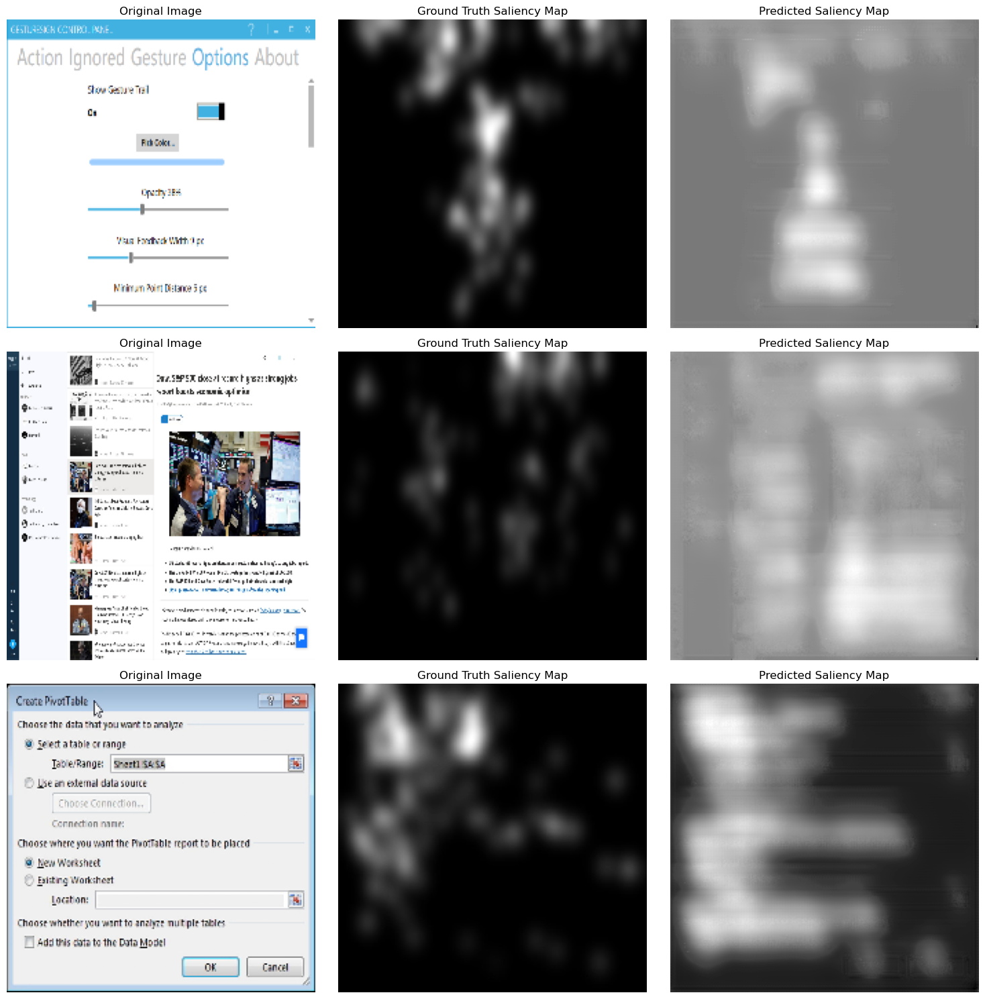

In [24]:
opt = Adam(learning_rate=0.001)

# Train the model using the same combined loss as the one in UEyes.ipynb, just with a smaller set of training data and less epochs
UMSI_2 = UMSI(input_shape=(224, 224, 3))
UMSI_2.compile(optimizer=opt, loss = combined_loss_2, metrics=[similarity])
history = UMSI_2.fit(train_data_gen, validation_data=valid_data_gen, epochs=15, steps_per_epoch=len(train_data_gen)) # Train the model and capture the history
plot_learning_curve(history)
visualize_results(UMSI_2, test_data_gen, num_samples=3) # 3 random examples

Epoch 1/15
50/50 [==============================] - 5s 100ms/step - loss: -22.6824 - similarity: 0.4128 - val_loss: -16.4468 - val_similarity: 0.4257
Epoch 2/15
50/50 [==============================] - 5s 98ms/step - loss: -22.6787 - similarity: 0.4108 - val_loss: -16.6683 - val_similarity: 0.4238
Epoch 3/15
50/50 [==============================] - 5s 94ms/step - loss: -22.9667 - similarity: 0.4111 - val_loss: -16.6692 - val_similarity: 0.4251
Epoch 4/15
50/50 [==============================] - 5s 94ms/step - loss: -23.1223 - similarity: 0.4108 - val_loss: -17.3180 - val_similarity: 0.4247
Epoch 5/15
50/50 [==============================] - 5s 93ms/step - loss: -23.2307 - similarity: 0.4113 - val_loss: -17.1687 - val_similarity: 0.4251
Epoch 6/15
50/50 [==============================] - 5s 94ms/step - loss: -23.0913 - similarity: 0.4108 - val_loss: -17.3221 - val_similarity: 0.4265
Epoch 7/15
50/50 [==============================] - 5s 99ms/step - loss: -23.3258 - similarity: 0.4116 - 

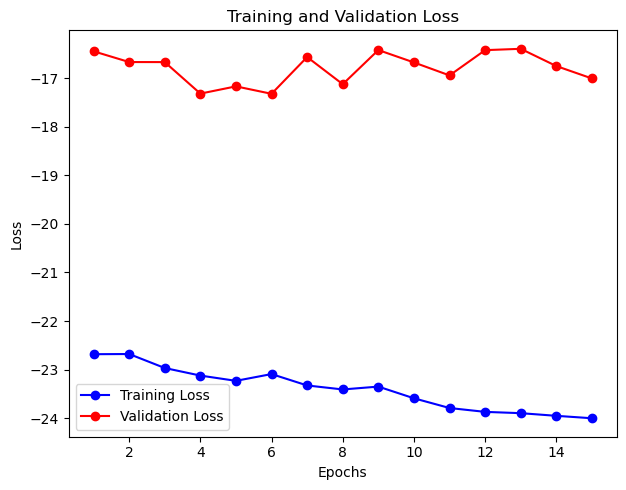

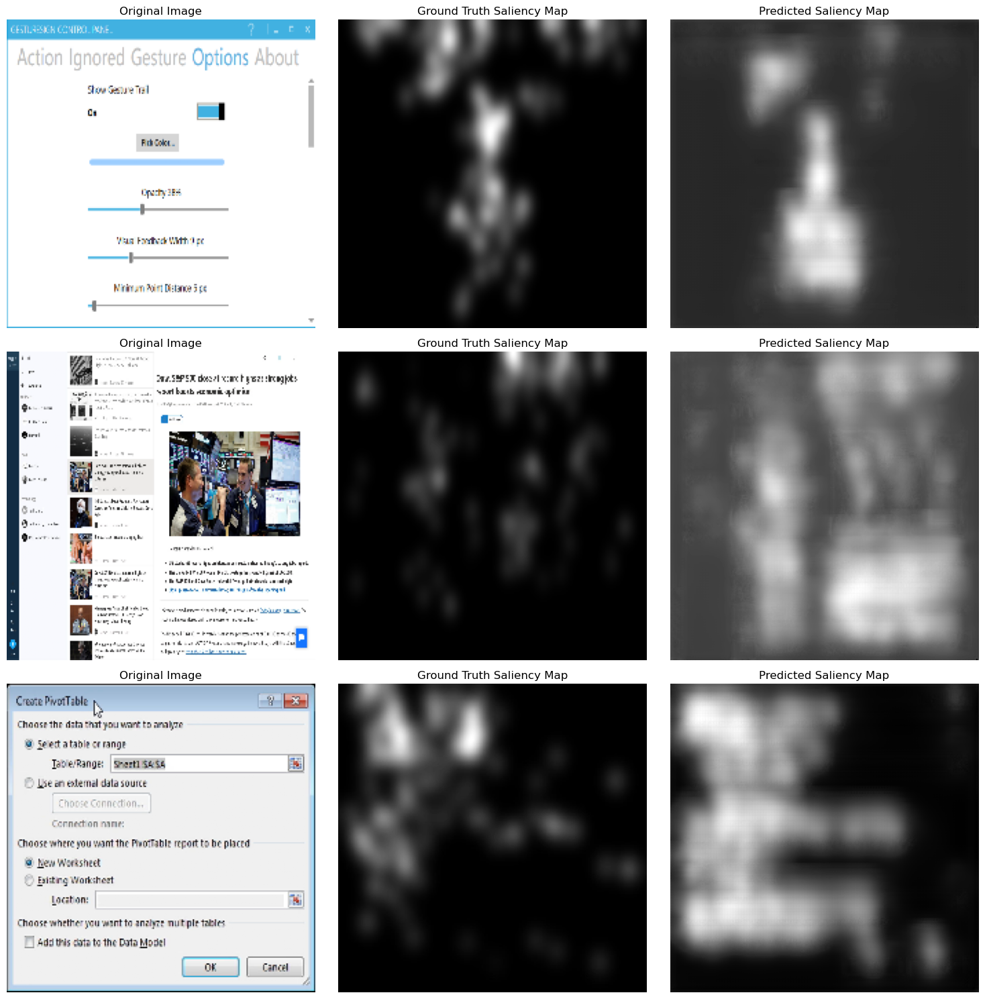

In [26]:
history = UMSI_2.fit(train_data_gen, validation_data=valid_data_gen, epochs=15, steps_per_epoch=len(train_data_gen)) # Train the model and capture the history
plot_learning_curve(history)
visualize_results(UMSI_2, test_data_gen, num_samples=3) # 3 random examples

In [28]:
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=0.001,
    decay_steps=10000,
    decay_rate=0.9)
opt = Adam(learning_rate=lr_schedule)